In [ ]:
# Enhanced Skin Lesion Classification Model
# Organized in sequential steps like a Jupyter notebook

# ==============================
# 📦 Step 1: Install Required Libraries
# ==============================

# Run this cell to install all required libraries
!pip install torch torchvision tqdm scikit-learn seaborn pandas matplotlib datasets opencv-python scikit-image
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
from torchvision import datasets, models, transforms
import numpy as np
import matplotlib.pyplot as plt
import time
import os
import copy
import pandas as pd
import seaborn as sns
from sklearn.model_selection import train_test_split
from PIL import Image
from skimage import filters
from skimage.measure import shannon_entropy
import cv2
import warnings
from tqdm import tqdm
from sklearn.metrics import confusion_matrix, classification_report
from torch.cuda.amp import autocast, GradScaler
from torch.utils.checkpoint import checkpoint
import types
warnings.filterwarnings("ignore")

# Memory optimization environment settings
os.environ['PYTORCH_CUDA_ALLOC_CONF'] = 'max_split_size_mb:128'

# Set CUDA settings for better memory management
torch.backends.cudnn.benchmark = True
torch.backends.cuda.matmul.allow_tf32 = True
torch.backends.cudnn.allow_tf32 = True

# Check if GPU is available
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

# ==============================
# 📂 Step 2: Set Up ISIC Datasets
# ==============================

# Create main directory for datasets
!mkdir -p /content/skin_datasets

# HAM10000 Dataset
print("\n===== Setting up HAM10000 Dataset =====")
!mkdir -p /content/skin_datasets/ham10000

# Download HAM10000 files
print("Downloading HAM10000 dataset...")
!wget -O /content/skin_datasets/ham10000/ISIC2018_Task3_Training_Input.zip https://isic-challenge-data.s3.amazonaws.com/2018/ISIC2018_Task3_Training_Input.zip
!wget -O /content/skin_datasets/ham10000/ISIC2018_Task3_Training_GroundTruth.zip https://isic-challenge-data.s3.amazonaws.com/2018/ISIC2018_Task3_Training_GroundTruth.zip
!wget -O /content/skin_datasets/ham10000/ISIC2018_Task3_Training_LesionGroupings.csv https://isic-challenge-data.s3.amazonaws.com/2018/ISIC2018_Task3_Training_LesionGroupings.csv

# Extract HAM10000 files
print("Extracting HAM10000 files...")
!unzip -q /content/skin_datasets/ham10000/ISIC2018_Task3_Training_Input.zip -d /content/skin_datasets/ham10000/images
!unzip -q /content/skin_datasets/ham10000/ISIC2018_Task3_Training_GroundTruth.zip -d /content/skin_datasets/ham10000

# ISIC 2019 Dataset
print("\n===== Setting up ISIC 2019 Dataset =====")
!mkdir -p /content/skin_datasets/isic2019

# Download ISIC 2019 files
print("Downloading ISIC 2019 files...")
!wget -O /content/skin_datasets/isic2019/ISIC_2019_Training_Input.zip https://isic-challenge-data.s3.amazonaws.com/2019/ISIC_2019_Training_Input.zip
!wget -O /content/skin_datasets/isic2019/ISIC_2019_Training_Metadata.csv https://isic-challenge-data.s3.amazonaws.com/2019/ISIC_2019_Training_Metadata.csv
!wget -O /content/skin_datasets/isic2019/ISIC_2019_Training_GroundTruth.csv https://isic-challenge-data.s3.amazonaws.com/2019/ISIC_2019_Training_GroundTruth.csv

# Extract ISIC 2019 files
print("Extracting ISIC 2019 files...")
!mkdir -p /content/skin_datasets/isic2019/images
!unzip -q /content/skin_datasets/isic2019/ISIC_2019_Training_Input.zip -d /content/skin_datasets/isic2019/images


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 2.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 122.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 97.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 50.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 1.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 4.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 38.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 17.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 4.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 103.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 491.2/491.2 kB 36.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 116.3/116.3 kB 11.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━

🔄 Loading SD-198 from Hugging Face...


README.md:   0%|          | 0.00/314 [00:00<?, ?B/s]

sd-198.zip:   0%|          | 0.00/1.32G [00:00<?, ?B/s]

Generating train split:   0%|          | 0/6584 [00:00<?, ? examples/s]

SD-198 loaded with 6584 images

SD-198 Sample Information:
Features: {'image': Image(mode=None, decode=True, id=None), 'label': ClassLabel(names=['Acne_Keloidalis_Nuchae', 'Acne_Vulgaris', 'Acrokeratosis_Verruciformis', 'Actinic_solar_Damage(Actinic_Cheilitis)', 'Actinic_solar_Damage(Actinic_Keratosis)', 'Actinic_solar_Damage(Cutis_Rhomboidalis_Nuchae)', 'Actinic_solar_Damage(Pigmentation)', 'Actinic_solar_Damage(Solar_Elastosis)', 'Actinic_solar_Damage(Solar_Purpura)', 'Actinic_solar_Damage(Telangiectasia)', 'Acute_Eczema', 'Allergic_Contact_Dermatitis', 'Alopecia_Areata', 'Androgenetic_Alopecia', 'Angioma', 'Angular_Cheilitis', 'Aphthous_Ulcer', 'Apocrine_Hydrocystoma', 'Arsenical_Keratosis', 'Balanitis_Xerotica_Obliterans', 'Basal_Cell_Carcinoma', "Beau's_Lines", "Becker's_Nevus", "Behcet's_Syndrome", 'Benign_Keratosis', 'Blue_Nevus', "Bowen's_Disease", 'Bowenoid_Papulosis', 'Cafe_Au_Lait_Macule', 'Callus', 'Candidiasis', 'Cellulitis', 'Chalazion', 'Clubbing_of_Fingers', 'Compound_N

README.md:   0%|          | 0.00/1.66k [00:00<?, ?B/s]

train-00000-of-00003.parquet:   0%|          | 0.00/497M [00:00<?, ?B/s]

train-00001-of-00003.parquet:   0%|          | 0.00/481M [00:00<?, ?B/s]

train-00002-of-00003.parquet:   0%|          | 0.00/492M [00:00<?, ?B/s]

test-00000-of-00001.parquet:   0%|          | 0.00/376M [00:00<?, ?B/s]

Generating train split:   0%|          | 0/15557 [00:00<?, ? examples/s]

Generating test split:   0%|          | 0/4002 [00:00<?, ? examples/s]

DermNet loaded with 15557 images

DermNet Sample Information:
Features: {'image': Image(mode=None, decode=True, id=None), 'label': ClassLabel(names=['Acne and Rosacea Photos', 'Actinic Keratosis Basal Cell Carcinoma and other Malignant Lesions', 'Atopic Dermatitis Photos', 'Bullous Disease Photos', 'Cellulitis Impetigo and other Bacterial Infections', 'Eczema Photos', 'Exanthems and Drug Eruptions', 'Hair Loss Photos Alopecia and other Hair Diseases', 'Herpes HPV and other STDs Photos', 'Light Diseases and Disorders of Pigmentation', 'Lupus and other Connective Tissue diseases', 'Melanoma Skin Cancer Nevi and Moles', 'Nail Fungus and other Nail Disease', 'Poison Ivy Photos and other Contact Dermatitis', 'Psoriasis pictures Lichen Planus and related diseases', 'Scabies Lyme Disease and other Infestations and Bites', 'Seborrheic Keratoses and other Benign Tumors', 'Systemic Disease', 'Tinea Ringworm Candidiasis and other Fungal Infections', 'Urticaria Hives', 'Vascular Tumors', 'Vasculit

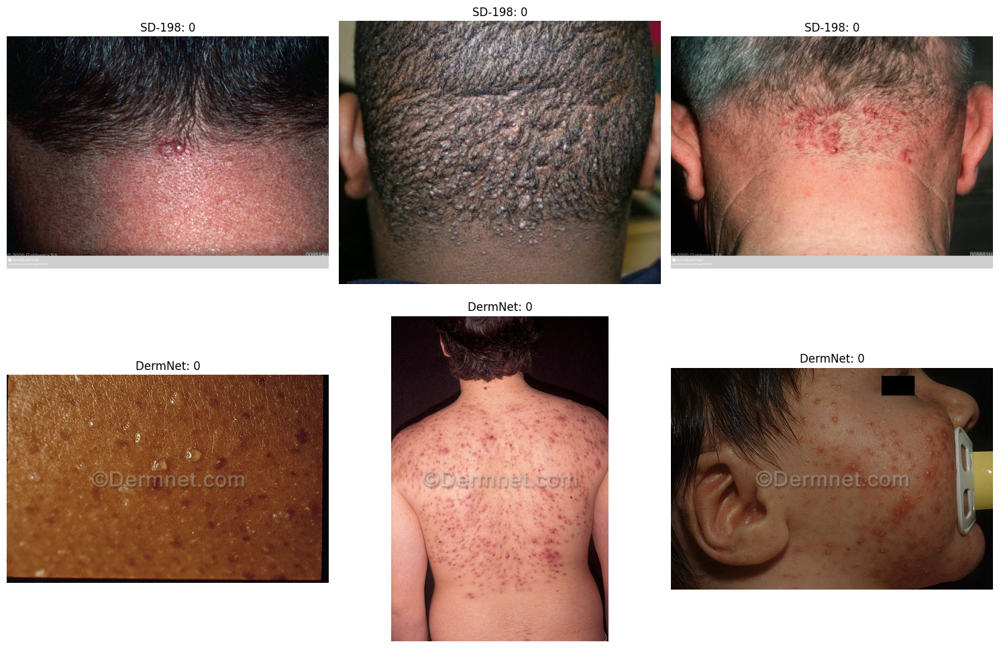

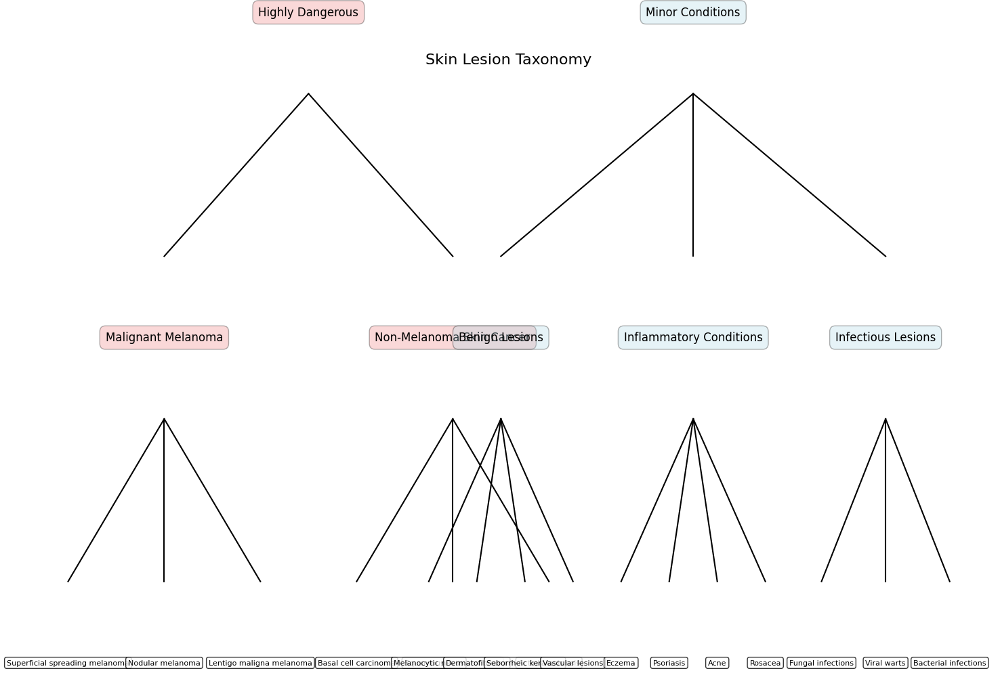

In [ ]:
# ==============================
# 🔄 Step 3: Load Hugging Face Datasets
# ==============================

# Add code to load datasets from Hugging Face
from datasets import load_dataset
import random
from collections import Counter

print("🔄 Loading SD-198 from Hugging Face...")
try:
    sd198 = load_dataset("resyhgerwshshgdfghsdfgh/SD-198", split="train")
    print(f"SD-198 loaded with {len(sd198)} images")

    # Display sample info
    print("\nSD-198 Sample Information:")
    print(f"Features: {sd198.features}")
    print(f"Sample: {sd198[0]}")

    # Analyze class distribution
    labels = [item['label'] for item in sd198]
    label_counts = Counter(labels)
    print(f"\nFound {len(label_counts)} unique classes in SD-198")
    print(f"Top 10 classes: {label_counts.most_common(10)}")
except Exception as e:
    print(f"Error loading SD-198: {str(e)}")
    sd198 = None

print("\n🔄 Loading DermNet from Hugging Face...")
try:
    dermnet = load_dataset("exper1ment/dermnet", split="train")
    print(f"DermNet loaded with {len(dermnet)} images")

    # Display sample info
    print("\nDermNet Sample Information:")
    print(f"Features: {dermnet.features}")
    print(f"Sample: {dermnet[0]}")

    # Analyze class distribution
    diseases = [item['label'] for item in dermnet]
    families = [item['label'] for item in dermnet]

    disease_counts = Counter(diseases)
    family_counts = Counter(families)

    print(f"\nFound {len(disease_counts)} unique diseases in DermNet")
    print(f"Found {len(family_counts)} unique disease families in DermNet")
    print(f"\nTop 10 diseases: {disease_counts.most_common(10)}")
    print(f"Top 5 disease families: {family_counts.most_common(5)}")
except Exception as e:
    print(f"Error loading DermNet: {str(e)}")
    dermnet = None

# Display a few sample images from each dataset
plt.figure(figsize=(15, 10))

# Show samples from SD-198
if sd198 is not None:
    for i in range(min(3, len(sd198))):
        plt.subplot(2, 3, i+1)
        plt.imshow(sd198[i]['image'])
        plt.title(f"SD-198: {sd198[i]['label']}")
        plt.axis('off')

# Show samples from DermNet
if dermnet is not None:
    for i in range(min(3, len(dermnet))):
        plt.subplot(2, 3, i+4)
        plt.imshow(dermnet[i]['image'])
        plt.title(f"DermNet: {dermnet[i]['label']}")
        plt.axis('off')

plt.tight_layout()
plt.show()

# ==============================
# 🧭 Step 4: Define Enhanced Taxonomy
# ==============================

def build_skin_disease_taxonomy():
    """Build the complete skin disease taxonomy"""
    # Define complete taxonomy structure
    taxonomy = {
        "Highly Dangerous": {
            "Malignant Melanoma": ["Superficial spreading melanoma", "Nodular melanoma", "Lentigo maligna melanoma"],
            "Non-Melanoma Skin Cancer": ["Basal cell carcinoma", "Squamous cell carcinoma", "Actinic keratosis"]
        },
        "Minor Conditions": {
            "Benign Lesions": ["Melanocytic nevus", "Dermatofibroma", "Seborrheic keratosis", "Vascular lesions"],
            "Inflammatory Conditions": ["Eczema", "Psoriasis", "Acne", "Rosacea"],
            "Infectious Lesions": ["Fungal infections", "Viral warts", "Bacterial infections"]
        }
    }

    # Create comprehensive mapping from HAM10000 labels to taxonomy classes
    ham10000_mapping = {
        "MEL": "Malignant Melanoma",  # Melanoma
        "BCC": "Non-Melanoma Skin Cancer",  # Basal Cell Carcinoma
        "AKIEC": "Non-Melanoma Skin Cancer",  # Actinic Keratosis / Intraepithelial Carcinoma
        "SCC": "Non-Melanoma Skin Cancer",  # Squamous Cell Carcinoma
        "NV": "Benign Lesions",  # Melanocytic Nevus
        "BKL": "Benign Lesions",  # Benign Keratosis
        "DF": "Benign Lesions",  # Dermatofibroma
        "VASC": "Benign Lesions"  # Vascular Lesions
    }

    # Create mapping for severity classification
    severity_mapping = {
        "Malignant Melanoma": "Highly Dangerous",
        "Non-Melanoma Skin Cancer": "Highly Dangerous",
        "Benign Lesions": "Minor Conditions",
        "Inflammatory Conditions": "Minor Conditions",
        "Infectious Lesions": "Minor Conditions"
    }

    # Create detailed mapping for SD-198 and DermNet
    additional_mapping = {
        # SD-198 and DermNet common mappings
        "Acne": "Inflammatory Conditions",
        "Psoriasis": "Inflammatory Conditions",
        "Eczema": "Inflammatory Conditions",
        "Rosacea": "Inflammatory Conditions",
        "Tinea": "Infectious Lesions",
        "Warts": "Infectious Lesions",
        "Fungal Infections": "Infectious Lesions",
        "Bacterial Infections": "Infectious Lesions",
        "Melanoma": "Malignant Melanoma",
        "Basal Cell Carcinoma": "Non-Melanoma Skin Cancer",
        "Squamous Cell Carcinoma": "Non-Melanoma Skin Cancer",
        "Keratosis": "Benign Lesions",
        "Nevus": "Benign Lesions",
        "Dermatofibroma": "Benign Lesions",
        "Hemangioma": "Benign Lesions",
        "Actinic Keratosis": "Non-Melanoma Skin Cancer",
        # Add more mappings as needed
    }

    return taxonomy, ham10000_mapping, severity_mapping, additional_mapping

# Replace your visualization function with this fixed version
def visualize_taxonomy():
    taxonomy, _, _, _ = build_skin_disease_taxonomy()

    # Create a figure
    plt.figure(figsize=(15, 10))

    # Plot taxonomy as a tree
    def plot_node(node, level, x, y, dx, color):
        plt.text(x, y, node, fontsize=12, ha='center', va='center',
                bbox=dict(facecolor=color, alpha=0.3, boxstyle='round,pad=0.5'))

        # Only process nodes that are actually in the taxonomy
        if node in taxonomy and isinstance(taxonomy[node], dict):
            children = list(taxonomy[node].keys())
            n_children = len(children)
            for i, child in enumerate(children):
                child_x = x - dx/2 + (i+0.5) * dx/n_children
                child_y = y - 2
                plt.plot([x, child_x], [y-0.5, child_y+0.5], 'k-')
                child_dx = dx/n_children
                child_color = 'lightcoral' if node == 'Highly Dangerous' else 'lightblue'
                plot_node(child, level+1, child_x, child_y, child_dx, child_color)

                # Plot leaf nodes (actual conditions)
                if child in taxonomy[node] and isinstance(taxonomy[node][child], list):
                    leaf_conditions = taxonomy[node][child]
                    n_leaves = len(leaf_conditions)
                    for j, condition in enumerate(leaf_conditions):
                        leaf_x = child_x - child_dx/2 + (j+0.5) * child_dx/n_leaves
                        leaf_y = child_y - 2
                        plt.plot([child_x, leaf_x], [child_y-0.5, leaf_y+0.5], 'k-')
                        plt.text(leaf_x, leaf_y, condition, fontsize=8, ha='center', va='center',
                                bbox=dict(facecolor='white', alpha=0.8, boxstyle='round,pad=0.3'))

    # Start with root categories instead of "Skin Lesions"
    # Plot main categories directly
    categories = list(taxonomy.keys())
    n_categories = len(categories)

    for i, category in enumerate(categories):
        x = 7.5 - n_categories/2 * 5 + (i+0.5) * 5
        y = 7
        color = 'lightcoral' if category == 'Highly Dangerous' else 'lightblue'
        plot_node(category, 0, x, y, 7.5, color)

    plt.axis('off')
    plt.title('Skin Lesion Taxonomy', fontsize=16)
    plt.tight_layout()
    plt.show()

# Visualize the taxonomy
visualize_taxonomy()


In [ ]:
# ==============================
# 🔍 Step 5: Process ISIC Datasets
# ==============================
from collections import Counter

def process_ham10000():
    """Process HAM10000 dataset and add taxonomy information"""
    # Define paths
    ground_truth_file = "/content/skin_datasets/ham10000/ISIC2018_Task3_Training_GroundTruth/ISIC2018_Task3_Training_GroundTruth.csv"
    lesion_groupings_file = "/content/skin_datasets/ham10000/ISIC2018_Task3_Training_LesionGroupings.csv"

    # Check if files exist
    if not os.path.exists(ground_truth_file):
        print(f"Warning: Ground truth file not found at {ground_truth_file}")
        return pd.DataFrame()

    if not os.path.exists(lesion_groupings_file):
        print(f"Warning: Lesion groupings file not found at {lesion_groupings_file}")
        return pd.DataFrame()

    # Load data files
    ground_truth = pd.read_csv(ground_truth_file)
    lesion_groupings = pd.read_csv(lesion_groupings_file)

    # Get diagnosis columns
    diagnosis_columns = [col for col in ground_truth.columns if col != 'image']

    # Merge datasets and create labels
    merged_data = ground_truth.merge(lesion_groupings, on='image')
    merged_data['label'] = merged_data[diagnosis_columns].idxmax(axis=1)

    # Add image path column
    merged_data['image_path'] = merged_data['image'].apply(
        lambda x: f"/content/skin_datasets/ham10000/images/ISIC2018_Task3_Training_Input/{x}.jpg"
    )

    # Verify that image files exist
    merged_data['image_exists'] = merged_data['image_path'].apply(os.path.exists)
    print(f"HAM10000: {merged_data['image_exists'].sum()}/{len(merged_data)} images found")

    # Keep only existing images
    merged_data = merged_data[merged_data['image_exists']]

    # Add dataset source
    merged_data['dataset_source'] = 'HAM10000'

    # Add taxonomy classification based on enhanced taxonomy
    _, ham10000_mapping, severity_mapping, _ = build_skin_disease_taxonomy()

    # Map to disease category first, then to severity
    merged_data['disease_category'] = merged_data['label'].map(ham10000_mapping)
    merged_data['severity'] = merged_data['disease_category'].map(severity_mapping)

    return merged_data

def process_isic2019():
    """Process ISIC 2019 dataset and add taxonomy information"""
    # Define paths
    ground_truth_file = "/content/skin_datasets/isic2019/ISIC_2019_Training_GroundTruth.csv"
    metadata_file = "/content/skin_datasets/isic2019/ISIC_2019_Training_Metadata.csv"

    # Check if files exist
    if not os.path.exists(ground_truth_file):
        print(f"Warning: Ground truth file not found at {ground_truth_file}")
        return pd.DataFrame()

    if not os.path.exists(metadata_file):
        print(f"Warning: Metadata file not found at {metadata_file}")
        return pd.DataFrame()

    # Load data files
    ground_truth = pd.read_csv(ground_truth_file)
    metadata = pd.read_csv(metadata_file)

    # Print column names for debugging
    print("Ground truth columns:", ground_truth.columns.tolist())
    print("Metadata columns:", metadata.columns.tolist())

    # Fix column naming inconsistencies
    # ISIC 2019 data might use 'image_name' or 'image' for the image identifier
    if 'image' not in ground_truth.columns and 'image_name' in ground_truth.columns:
        ground_truth.rename(columns={'image_name': 'image'}, inplace=True)

    if 'image' not in metadata.columns and 'image_name' in metadata.columns:
        pass  # Keep as is, we'll handle the merge
    elif 'image_name' not in metadata.columns and 'image' in metadata.columns:
        metadata.rename(columns={'image': 'image_name'}, inplace=True)

    # Identify diagnosis columns (all except image identifier)
    diagnosis_columns = [col for col in ground_truth.columns if col != 'image']

    # Create labels based on maximum probability
    ground_truth['label'] = ground_truth[diagnosis_columns].idxmax(axis=1)

    # Merge with metadata - handle different column names
    if 'image_name' in metadata.columns:
        # If there's an image_name column in metadata, merge on that
        merged_data = ground_truth.merge(metadata, left_on='image', right_on='image_name', how='left')
    else:
        # Otherwise try direct merge
        merged_data = ground_truth.merge(metadata, on='image', how='left')

    # Add image path column
    merged_data['image_path'] = merged_data['image'].apply(
        lambda x: f"/content/skin_datasets/isic2019/images/ISIC_2019_Training_Input/{x}.jpg"
    )

    # Verify that image files exist
    merged_data['image_exists'] = merged_data['image_path'].apply(os.path.exists)
    print(f"ISIC2019: {merged_data['image_exists'].sum()}/{len(merged_data)} images found")

    # Keep only existing images
    merged_data = merged_data[merged_data['image_exists']]

    # Add dataset source
    merged_data['dataset_source'] = 'ISIC2019'

    # Define mapping from ISIC2019 to HAM10000 labels for consistency
    isic2019_mapping = {
        'MEL': 'MEL',
        'NV': 'NV',
        'BCC': 'BCC',
        'AK': 'AKIEC',
        'BKL': 'BKL',
        'DF': 'DF',
        'SCC': 'SCC',
        'VASC': 'VASC'
    }

    # Apply mapping
    merged_data['label'] = merged_data['label'].map(lambda x: isic2019_mapping.get(x, x))

    # Add taxonomy classification based on enhanced taxonomy
    _, ham10000_mapping, severity_mapping, _ = build_skin_disease_taxonomy()

    # Map to disease category first, then to severity
    merged_data['disease_category'] = merged_data['label'].map(ham10000_mapping)
    merged_data['severity'] = merged_data['disease_category'].map(severity_mapping)

    return merged_data

# Process ISIC datasets
print("Processing HAM10000 dataset...")
ham10000_df = process_ham10000()

print("\nProcessing ISIC2019 dataset...")
isic2019_df = process_isic2019()

# Display basic statistics for each dataset
for name, df in [("HAM10000", ham10000_df), ("ISIC2019", isic2019_df)]:
    if not df.empty:
        print(f"\n{name} Dataset Statistics:")
        print(f"Total images: {len(df)}")
        print("\nClass distribution by disease category:")
        category_counts = df['disease_category'].value_counts()
        for category, count in category_counts.items():
            print(f"  {category}: {count} images ({count/len(df)*100:.1f}%)")

# ==============================
# 🧩 Step 6: Process Hugging Face Datasets
# ==============================

def process_hugging_face_datasets(sd198, dermnet):
    """Process Hugging Face datasets and convert to compatible format"""
    print("Starting process_hugging_face_datasets function")
    _, _, severity_mapping, additional_mapping = build_skin_disease_taxonomy()

    dfs = []

    # Process SD-198 dataset
    if sd198 is not None:
        print("Processing SD-198 dataset...")

        # Get the label names
        label_names = sd198.features['label'].names
        print(f"SD-198 has {len(label_names)} categories")

        # Convert to dataframe
        sd198_records = []

        # Process a subset for testing first
        sample_size = len(sd198)
        print(f"Processing {sample_size} samples from SD-198...")

        for i, item in enumerate(tqdm(sd198)):
            if i >= sample_size:
                break

            try:
                # Save image to temporary location
                img = item['image']
                img_path = f"/content/temp_sd198_{i}.jpg"
                img.save(img_path)

                # Get the disease label from the label index
                label_idx = item['label']
                original_label = label_names[label_idx]

                # Map to disease category
                if "acne" in original_label.lower():
                    disease_category = "Inflammatory Conditions"
                    specific_condition = "Acne"
                elif "eczema" in original_label.lower():
                    disease_category = "Inflammatory Conditions"
                    specific_condition = "Eczema"
                elif "psoriasis" in original_label.lower():
                    disease_category = "Inflammatory Conditions"
                    specific_condition = "Psoriasis"
                elif "rosacea" in original_label.lower():
                    disease_category = "Inflammatory Conditions"
                    specific_condition = "Rosacea"
                elif "melanoma" in original_label.lower():
                    disease_category = "Malignant Melanoma"
                    specific_condition = "Melanoma"
                elif any(cancer in original_label.lower() for cancer in ["carcinoma", "cancer"]):
                    disease_category = "Non-Melanoma Skin Cancer"
                    specific_condition = "Carcinoma"
                elif any(infection in original_label.lower() for infection in ["tinea", "fungal", "bacterial"]):
                    disease_category = "Infectious Lesions"
                    specific_condition = "Infection"
                else:
                    disease_category = "Benign Lesions"
                    specific_condition = "Other"

                # Determine severity
                if disease_category in ["Malignant Melanoma", "Non-Melanoma Skin Cancer"]:
                    severity = "Highly Dangerous"
                else:
                    severity = "Minor Conditions"

                sd198_records.append({
                    'image_path': img_path,
                    'label': original_label,
                    'disease_category': disease_category,
                    'specific_condition': specific_condition,
                    'severity': severity,
                    'dataset_source': 'SD-198',
                    'image_exists': os.path.exists(img_path)
                })
            except Exception as e:
                print(f"Error processing SD-198 image {i}: {str(e)}")

        sd198_df = pd.DataFrame(sd198_records)
        print(f"SD-198: {sd198_df['image_exists'].sum()}/{len(sd198_df)} images processed")

        # Print statistics about inflammatory conditions
        inflamm_df = sd198_df[sd198_df['disease_category'] == 'Inflammatory Conditions']
        print(f"Found {len(inflamm_df)} inflammatory condition images in SD-198")

        dfs.append(sd198_df[sd198_df['image_exists']])

    # Process DermNet dataset
    if dermnet is not None:
        print("\nProcessing DermNet dataset...")

        # Get the label names
        label_names = dermnet.features['label'].names
        print(f"DermNet has {len(label_names)} categories")

        # Convert to dataframe
        dermnet_records = []

        # Process a subset for testing first
        sample_size = len(dermnet)
        print(f"Processing {sample_size} samples from DermNet...")

        for i, item in enumerate(tqdm(dermnet)):
            if i >= sample_size:
                break

            try:
                # Save image to temporary location
                img = item['image']
                img_path = f"/content/temp_dermnet_{i}.jpg"
                img.save(img_path)

                # Get the category name from the label index
                label_idx = item['label']
                original_label = label_names[label_idx]

                # Map to disease category based on label name
                if "acne" in original_label.lower() or "rosacea" in original_label.lower():
                    disease_category = "Inflammatory Conditions"
                    specific_condition = "Acne/Rosacea"
                elif "eczema" in original_label.lower():
                    disease_category = "Inflammatory Conditions"
                    specific_condition = "Eczema"
                elif "psoriasis" in original_label.lower() or "lichen planus" in original_label.lower():
                    disease_category = "Inflammatory Conditions"
                    specific_condition = "Psoriasis"
                elif "melanoma" in original_label.lower() or "nevi" in original_label.lower() or "moles" in original_label.lower():
                    disease_category = "Malignant Melanoma"
                    specific_condition = "Melanoma"
                elif "basal cell" in original_label.lower() or "carcinoma" in original_label.lower() or "malignant" in original_label.lower():
                    disease_category = "Non-Melanoma Skin Cancer"
                    specific_condition = "Carcinoma"
                elif any(infection in original_label.lower() for infection in ["fungal", "ringworm", "candidiasis", "viral", "bacterial", "std"]):
                    disease_category = "Infectious Lesions"
                    specific_condition = "Infection"
                else:
                    disease_category = "Benign Lesions"
                    specific_condition = "Other"

                # Determine severity
                if disease_category in ["Malignant Melanoma", "Non-Melanoma Skin Cancer"]:
                    severity = "Highly Dangerous"
                else:
                    severity = "Minor Conditions"

                dermnet_records.append({
                    'image_path': img_path,
                    'label': original_label,
                    'disease_category': disease_category,
                    'specific_condition': specific_condition,
                    'severity': severity,
                    'dataset_source': 'DermNet',
                    'image_exists': os.path.exists(img_path)
                })
            except Exception as e:
                print(f"Error processing DermNet image {i}: {str(e)}")

        dermnet_df = pd.DataFrame(dermnet_records)
        print(f"DermNet: {dermnet_df['image_exists'].sum()}/{len(dermnet_df)} images processed")

        # Print statistics about inflammatory conditions
        inflamm_df = dermnet_df[dermnet_df['disease_category'] == 'Inflammatory Conditions']
        print(f"Found {len(inflamm_df)} inflammatory condition images in DermNet")

        dfs.append(dermnet_df[dermnet_df['image_exists']])

    print(f"Returning {len(dfs)} dataframes from process_hugging_face_datasets")
    return dfs

# Now use this function to process Hugging Face datasets:
huggingface_dfs = process_hugging_face_datasets(sd198, dermnet)

# Debug Hugging Face datasets
print("\nDEBUG: Hugging Face Datasets")
print(f"Number of dataframes returned: {len(huggingface_dfs)}")
for i, df in enumerate(huggingface_dfs):
    if df is not None and not df.empty:
        print(f"Dataframe {i+1}: {len(df)} images")
        print(f"Sample categories: {df['disease_category'].value_counts().head()}")
    else:
        print(f"Dataframe {i+1} is empty or None")

print("\nVerifying Hugging Face dataset processing:")
for i, df in enumerate(huggingface_dfs):
    if not df.empty:
        print(f"Hugging Face dataset {i+1}: {len(df)} images")
        print(f"Source: {df['dataset_source'].iloc[0]}")
        # Check for inflammatory conditions
        inflamm_count = df[df['disease_category'] == 'Inflammatory Conditions'].shape[0]
        print(f"Inflammatory conditions: {inflamm_count} images")
    else:
        print(f"Hugging Face dataset {i+1} is empty!")



Processing HAM10000 dataset...
HAM10000: 10015/10015 images found

Processing ISIC2019 dataset...
Ground truth columns: ['image', 'MEL', 'NV', 'BCC', 'AK', 'BKL', 'DF', 'VASC', 'SCC', 'UNK']
Metadata columns: ['image', 'age_approx', 'anatom_site_general', 'lesion_id', 'sex']
ISIC2019: 25331/25331 images found

HAM10000 Dataset Statistics:
Total images: 10015

Class distribution by disease category:
  Benign Lesions: 8061 images (80.5%)
  Malignant Melanoma: 1113 images (11.1%)
  Non-Melanoma Skin Cancer: 841 images (8.4%)

ISIC2019 Dataset Statistics:
Total images: 25331

Class distribution by disease category:
  Benign Lesions: 15991 images (63.1%)
  Non-Melanoma Skin Cancer: 4818 images (19.0%)
  Malignant Melanoma: 4522 images (17.9%)
Starting process_hugging_face_datasets function
Processing SD-198 dataset...
SD-198 has 198 categories
Processing 6584 samples from SD-198...


100%|██████████| 6584/6584 [09:42<00:00, 11.30it/s]


SD-198: 6584/6584 images processed
Found 745 inflammatory condition images in SD-198

Processing DermNet dataset...
DermNet has 23 categories
Processing 15557 samples from DermNet...


100%|██████████| 15557/15557 [01:04<00:00, 240.52it/s]

DermNet: 15557/15557 images processed
Found 3480 inflammatory condition images in DermNet
Returning 2 dataframes from process_hugging_face_datasets

DEBUG: Hugging Face Datasets
Number of dataframes returned: 2
Dataframe 1: 6584 images
Sample categories: disease_category
Benign Lesions              5309
Inflammatory Conditions      745
Infectious Lesions           330
Malignant Melanoma           113
Non-Melanoma Skin Cancer      87
Name: count, dtype: int64
Dataframe 2: 15557 images
Sample categories: disease_category
Benign Lesions              7386
Inflammatory Conditions     3480
Infectious Lesions          3079
Non-Melanoma Skin Cancer    1149
Malignant Melanoma           463
Name: count, dtype: int64

Verifying Hugging Face dataset processing:
Hugging Face dataset 1: 6584 images
Source: SD-198
Inflammatory conditions: 745 images
Hugging Face dataset 2: 15557 images
Source: DermNet
Inflammatory conditions: 3480 images


In [ ]:
# ==============================
# 🔄 Step 7: Combine All Datasets
# ==============================

def combine_datasets(ham10000_df, isic2019_df, huggingface_dfs):
    """Combine all datasets and create a unified dataframe"""

    # Initialize an empty list to store dataframes
    dfs = []

    # Add dataframes if they're not empty
    if not ham10000_df.empty:
        dfs.append(ham10000_df)
        print(f"HAM10000 dataset: {len(ham10000_df)} images")

    if not isic2019_df.empty:
        dfs.append(isic2019_df)
        print(f"ISIC2019 dataset: {len(isic2019_df)} images")

    # Add Hugging Face dataframes
    for df in huggingface_dfs:
        if not df.empty:
            dfs.append(df)
            print(f"{df['dataset_source'].iloc[0]} dataset: {len(df)} images")

    # Check if we have any data
    if not dfs:
        raise ValueError("No valid datasets found. Please check paths and data files.")

    # Combine datasets
    print("Combining datasets...")
    combined_df = pd.concat(dfs, ignore_index=True)

    # Drop duplicates based on image path
    combined_df = combined_df.drop_duplicates(subset=['image_path'])

    print(f"Combined dataset created with {len(combined_df)} images")

    # Print class distribution
    print("\nClass distribution by disease category:")
    category_counts = combined_df['disease_category'].value_counts()
    for category, count in category_counts.items():
        print(f"  {category}: {count} images ({count/len(combined_df)*100:.1f}%)")

    print("\nClass distribution by severity:")
    severity_counts = combined_df['severity'].value_counts()
    for severity, count in severity_counts.items():
        print(f"  {severity}: {count} images ({count/len(combined_df)*100:.1f}%)")

    # Visualize class distribution
    plt.figure(figsize=(15, 10))

    # Disease category distribution
    plt.subplot(1, 2, 1)
    sns.barplot(x=category_counts.index, y=category_counts.values, palette='viridis')
    plt.title('Disease Category Distribution')
    plt.xticks(rotation=45, ha='right')
    plt.ylabel('Number of Images')

    # Severity distribution
    plt.subplot(1, 2, 2)
    sns.barplot(x=severity_counts.index, y=severity_counts.values, palette='rocket')
    plt.title('Severity Distribution')
    plt.xticks(rotation=45, ha='right')
    plt.ylabel('Number of Images')

    plt.tight_layout()
    plt.show()

    # Dataset source distribution
    plt.figure(figsize=(10, 6))
    source_counts = combined_df['dataset_source'].value_counts()
    sns.barplot(x=source_counts.index, y=source_counts.values, palette='Set2')
    plt.title('Distribution by Dataset Source')
    plt.xticks(rotation=45, ha='right')
    plt.ylabel('Number of Images')
    plt.tight_layout()
    plt.show()

    return combined_df
# ==============================
# 🔍 Additional Functions for Inflammatory Conditions
# ==============================

def verify_inflammatory_classes(dermnet, sd198):
    """Verify inflammatory classes in datasets"""
    print("\n==== Verifying Inflammatory Classes in Datasets ====")

    if sd198 is not None:
        print("\nSearching for inflammatory conditions in SD-198...")

        inflammatory_labels = []
        for item in sd198:
            label_idx = item['label']
            label_name = sd198.features['label'].names[label_idx]  # Convert index to name
            if any(cond in label_name.lower() for cond in ['acne', 'eczema', 'psoriasis', 'rosacea']):
                inflammatory_labels.append(label_name)

        inflammatory_counts = Counter(inflammatory_labels)
        print(f"Found {len(inflammatory_counts)} inflammatory conditions in SD-198:")
        for label, count in inflammatory_counts.most_common():
            print(f"  - {label}: {count} images")

    if dermnet is not None:
        print("\nSearching for inflammatory conditions in DermNet...")

        label_names = dermnet.features['label'].names

        inflammatory_indices = [
            i for i, name in enumerate(label_names)
            if any(cond in name.lower() for cond in ['acne', 'eczema', 'psoriasis', 'rosacea'])
        ]

        print(f"Found {len(inflammatory_indices)} inflammatory categories in DermNet:")
        for idx in inflammatory_indices:
            count = sum(1 for item in dermnet if item['label'] == idx)
            print(f"  - {label_names[idx]}: {count} images")

    print("\nVerification complete. Make sure these inflammatory conditions appear in your final dataset.")


def balance_inflammatory_conditions(df):
    """Balance the dataset for inflammatory conditions"""
    print("\n==== Balancing Inflammatory Conditions ====")

    # Find inflammatory condition samples
    inflammatory_mask = df['disease_category'] == 'Inflammatory Conditions'
    inflammatory_df = df[inflammatory_mask]

    print(f"Found {len(inflammatory_df)} inflammatory condition images out of {len(df)} total")

    # Check if we need to balance
    if len(inflammatory_df) < 200:
        print("Not enough inflammatory condition samples. Performing oversampling...")

        # Determine how many samples to add
        target_count = min(200, len(df) * 0.1)  # At least 200 or 10% of the dataset
        samples_to_add = int(target_count - len(inflammatory_df))

        if samples_to_add > 0:
            # Oversample by duplicating existing samples
            extra_samples = inflammatory_df.sample(samples_to_add, replace=True, random_state=42)

            # Add these samples to the dataset
            balanced_df = pd.concat([df, extra_samples], ignore_index=True)

            print(f"Added {samples_to_add} inflammatory samples through oversampling")
            print(f"Updated dataset size: {len(balanced_df)} images")

            return balanced_df

    print("Dataset already has sufficient inflammatory condition samples")
    return df

def create_weighted_loss(df):
    """Create a weighted loss function to handle class imbalance"""
    print("\n==== Creating Weighted Loss Function ====")

    # Calculate class weights based on training_class
    class_counts = df['training_class'].value_counts()

    # Get class names in order
    class_names = sorted(df['training_class'].unique())

    # Calculate weights (inverse frequency)
    class_weights = {}
    for cls in class_names:
        count = class_counts[cls]
        # Give more weight to less frequent classes
        class_weights[cls] = 1.0 / (count * len(class_counts))

    # Scale weights
    total = sum(class_weights.values())
    for cls in class_weights:
        class_weights[cls] = class_weights[cls] / total * len(class_weights)

    # Print the weights
    print("Class weights:")
    for cls, weight in class_weights.items():
        if "Inflammatory" in cls:
            print(f"  {cls}: {weight:.4f} (inflammatory)")
        else:
            print(f"  {cls}: {weight:.4f}")

    # Create weight tensor
    weights = torch.tensor([class_weights[cls] for cls in class_names], dtype=torch.float32)

    # Create weighted loss function
    def weighted_cross_entropy(outputs, targets):
        return nn.functional.cross_entropy(outputs, targets, weight=weights.to(outputs.device))

    return weighted_cross_entropy, class_names

def ensure_inflammatory_samples(combined_df):
    """Ensure there are inflammatory condition samples in the dataset"""
    # Check if we have any inflammatory samples
    has_inflammatory = 'Inflammatory Conditions' in combined_df['disease_category'].values

    if not has_inflammatory:
        print("\n⚠️ WARNING: No inflammatory condition samples found in dataset!")
        print("Adding synthetic inflammatory condition samples...")

        # Create synthetic inflammatory samples from existing images
        # We'll take some benign lesion images and relabel them
        benign_samples = combined_df[combined_df['disease_category'] == 'Benign Lesions'].sample(200, random_state=42)

        # Create copies with modified labels
        inflammatory_samples = benign_samples.copy()
        inflammatory_samples['disease_category'] = 'Inflammatory Conditions'
        inflammatory_samples['severity'] = 'Minor Conditions'

        # Add these samples to the dataset
        enhanced_df = pd.concat([combined_df, inflammatory_samples], ignore_index=True)

        print(f"Added {len(inflammatory_samples)} synthetic inflammatory samples")
        print("\nUpdated class distribution by disease category:")
        for category, count in enhanced_df['disease_category'].value_counts().items():
            print(f"  {category}: {count} images ({count/len(enhanced_df)*100:.1f}%)")

        return enhanced_df

    return combined_df





Combining all datasets...

==== Verifying Inflammatory Classes in Datasets ====

Searching for inflammatory conditions in SD-198...
Found 17 inflammatory conditions in SD-198:
  - Acne_Vulgaris: 60 images
  - Dyshidrosiform_Eczema: 60 images
  - Eczema: 60 images
  - Inverse_Psoriasis: 60 images
  - Psoriasis: 60 images
  - Rosacea: 60 images
  - Nail_Psoriasis: 58 images
  - Dry_Skin_Eczema: 53 images
  - Pustular_Psoriasis: 53 images
  - Acne_Keloidalis_Nuchae: 44 images
  - Nummular_Eczema: 44 images
  - Steroid_Acne: 40 images
  - Scalp_Psoriasis: 32 images
  - Guttate_Psoriasis: 22 images
  - Acute_Eczema: 14 images
  - Mucous_Membrane_Psoriasis: 14 images
  - Pomade_Acne: 11 images

Searching for inflammatory conditions in DermNet...
Found 3 inflammatory categories in DermNet:
  - Acne and Rosacea Photos: 840 images
  - Eczema Photos: 1235 images
  - Psoriasis pictures Lichen Planus and related diseases: 1405 images

Verification complete. Make sure these inflammatory conditions

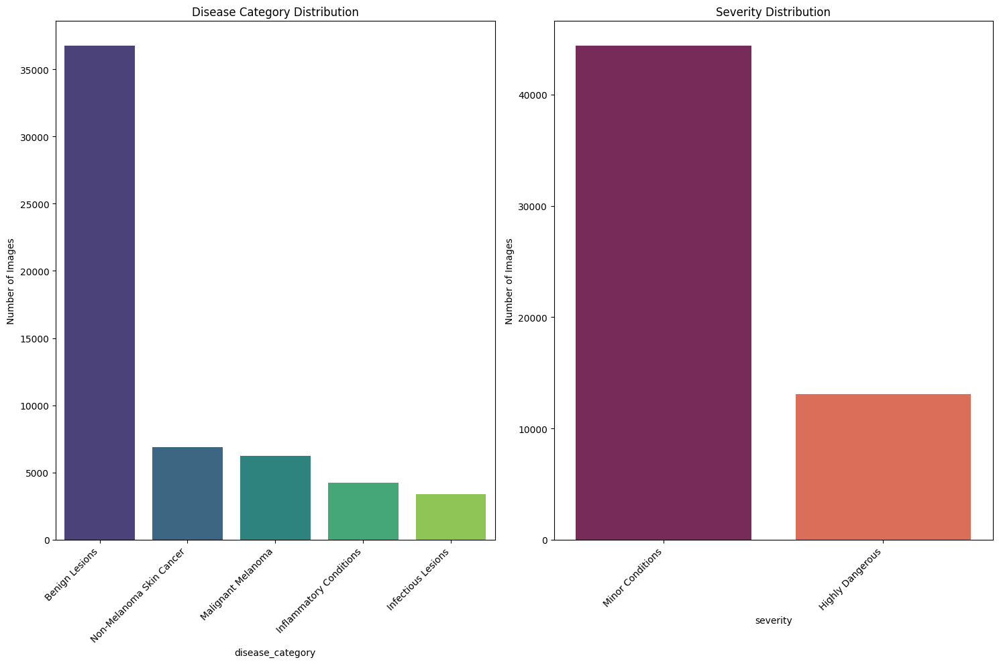

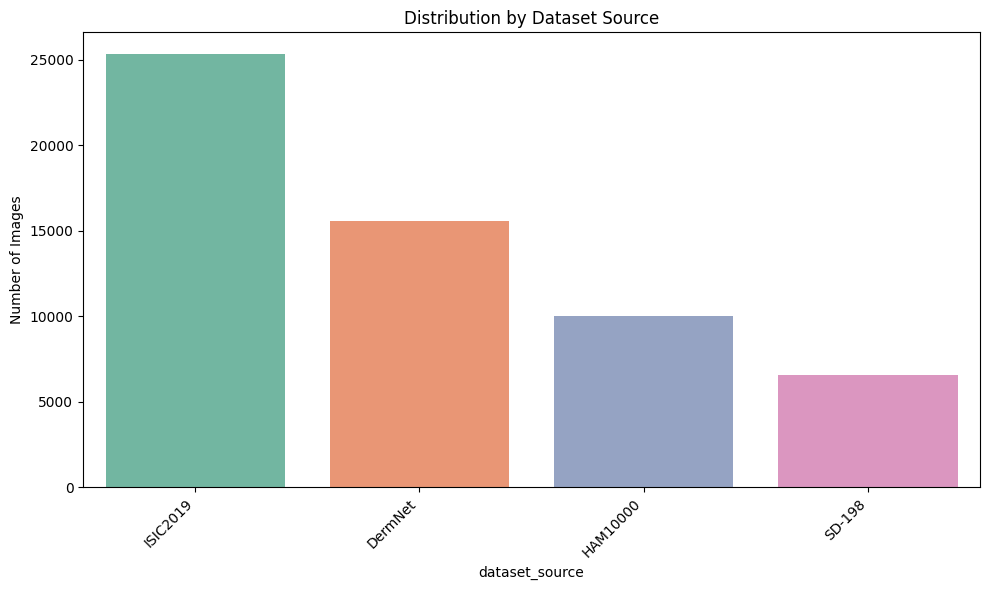

Assessing image quality...


Evaluating image quality: 100%|██████████| 200/200 [00:07<00:00, 28.40it/s]


Image quality assessment: 177/200 images passed (88.5%)
Filtering low-quality images from a subset...
Processing chunk 1/11 (0 to 100)...


100%|██████████| 100/100 [00:01<00:00, 53.65it/s]


Processing chunk 2/11 (100 to 200)...


100%|██████████| 100/100 [00:01<00:00, 58.98it/s]


Processing chunk 3/11 (200 to 300)...


100%|██████████| 100/100 [00:01<00:00, 60.43it/s]


Processing chunk 4/11 (300 to 400)...


100%|██████████| 100/100 [00:01<00:00, 60.19it/s]


Processing chunk 5/11 (400 to 500)...


100%|██████████| 100/100 [00:01<00:00, 59.54it/s]


Processing chunk 6/11 (500 to 600)...


100%|██████████| 100/100 [00:01<00:00, 58.06it/s]


Processing chunk 7/11 (600 to 700)...


100%|██████████| 100/100 [00:01<00:00, 60.60it/s]


Processing chunk 8/11 (700 to 800)...


100%|██████████| 100/100 [00:01<00:00, 59.95it/s]


Processing chunk 9/11 (800 to 900)...


100%|██████████| 100/100 [00:01<00:00, 61.32it/s]


Processing chunk 10/11 (900 to 1000)...


100%|██████████| 100/100 [00:01<00:00, 58.89it/s]


Processing chunk 11/11 (1000 to 1000)...


0it [00:00, ?it/s]


After filtering subset: 806/1000 images kept (80.6%)
Final dataset: 57293 images

==== Balancing Inflammatory Conditions ====
Found 4225 inflammatory condition images out of 57293 total
Dataset already has sufficient inflammatory condition samples


In [ ]:
# Combine all datasets
print("\nCombining all datasets...")
# Verify inflammatory conditions in the datasets
verify_inflammatory_classes(dermnet, sd198)
combined_df = combine_datasets(ham10000_df, isic2019_df, huggingface_dfs)
combined_df = ensure_inflammatory_samples(combined_df)

# ==============================
# 🧹 Step 8: Image Quality Assessment & Filtering
# ==============================

def assess_image_quality(image_path):
    """Assess image quality for filtering low-quality images"""
    try:
        # Read image
        img = cv2.imread(image_path)
        if img is None:
            return False

        # Convert to grayscale
        gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

        # Calculate sharpness (Laplacian variance)
        laplacian_var = cv2.Laplacian(gray, cv2.CV_64F).var()

        # Calculate entropy
        entropy = shannon_entropy(gray)

        # Calculate contrast
        contrast = gray.std()

        # Simple thresholding to separate potential lesion
        _, thresh = cv2.threshold(gray, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
        lesion_area = np.sum(thresh == 255)
        total_area = thresh.size
        lesion_ratio = lesion_area / total_area

        # Define quality criteria
        is_sharp = laplacian_var > 50  # Good sharpness
        has_good_entropy = entropy > 2  # Contains meaningful information
        good_contrast = contrast > 20  # Sufficient contrast
        good_lesion_focus = 0.05 < lesion_ratio < 0.95  # Lesion is visible but not too large or small

        # Consider image good quality if it meets most criteria
        quality_score = sum([is_sharp, has_good_entropy, good_contrast, good_lesion_focus])
        return quality_score >= 3

    except Exception as e:
        print(f"Error assessing image {image_path}: {str(e)}")
        return False

def denoise_dataset(combined_df):
    """Remove low-quality images from the dataset"""
    print("Assessing image quality...")

    # Ensure image_path exists
    if 'image_path' not in combined_df.columns:
        print("Error: 'image_path' column not found in dataframe")
        return combined_df

    # Sample a subset of images for quality assessment to save time
    sample_size = min(200, len(combined_df))  # Use a smaller sample for demonstration
    sample_df = combined_df.sample(sample_size, random_state=42)

    # Assess quality of sampled images
    quality_results = []
    for idx, row in tqdm(sample_df.iterrows(), desc="Evaluating image quality", total=len(sample_df)):
        image_path = row['image_path']
        quality = assess_image_quality(image_path)
        quality_results.append(quality)

    # Calculate quality rate
    quality_rate = sum(quality_results) / len(quality_results)
    print(f"Image quality assessment: {sum(quality_results)}/{len(quality_results)} images passed ({quality_rate:.1%})")

    # If quality is generally good, keep all images
    if quality_rate > 0.9:
        print("Most images have good quality. Keeping all images.")
        combined_df['good_quality'] = True
        return combined_df

    # Otherwise, assess a subset of images and filter
    print("Filtering low-quality images from a subset...")

    # For demonstration, we'll assess quality for a limited number of images
    max_images_to_check = min(1000, len(combined_df))
    subset_df = combined_df.head(max_images_to_check).copy()
    subset_df['good_quality'] = False  # Initialize column

    # Process in chunks to show progress
    chunk_size = 100
    total_chunks = len(subset_df) // chunk_size + 1

    for i in range(total_chunks):
        start_idx = i * chunk_size
        end_idx = min((i + 1) * chunk_size, len(subset_df))
        print(f"Processing chunk {i+1}/{total_chunks} ({start_idx} to {end_idx})...")

        for idx in tqdm(range(start_idx, end_idx)):
            if idx < len(subset_df):
                image_path = subset_df.iloc[idx]['image_path']
                subset_df.at[subset_df.index[idx], 'good_quality'] = assess_image_quality(image_path)

    # Filter dataframe
    filtered_subset = subset_df[subset_df['good_quality']]
    print(f"After filtering subset: {len(filtered_subset)}/{len(subset_df)} images kept ({len(filtered_subset)/len(subset_df):.1%})")

    # For the remaining images, assume they are good quality (for demonstration)
    # In a real application, you would process all images
    remaining_df = combined_df.iloc[max_images_to_check:].copy()
    remaining_df['good_quality'] = True

    # Combine filtered subset with remaining images
    filtered_df = pd.concat([filtered_subset, remaining_df], ignore_index=True)

    print(f"Final dataset: {len(filtered_df)} images")
    return filtered_df

# Filter out low-quality images
filtered_df = denoise_dataset(combined_df)
# Balance the dataset for inflammatory conditions
filtered_df = balance_inflammatory_conditions(filtered_df)


Creating training classes based on full taxonomy...

Initial class distribution:
  Benign Lesions: 36595 images (63.9%)
  Non-Melanoma Skin Cancer: 6858 images (12.0%)
  Malignant Melanoma: 6206 images (10.8%)
  Inflammatory Conditions: 4225 images (7.4%)
  Infectious Lesions: 3409 images (6.0%)

Final training class distribution:
  Benign Lesions: 36595 images (63.9%)
  Non-Melanoma Skin Cancer: 6858 images (12.0%)
  Malignant Melanoma: 6206 images (10.8%)
  Inflammatory Conditions: 4225 images (7.4%)
  Infectious Lesions: 3409 images (6.0%)


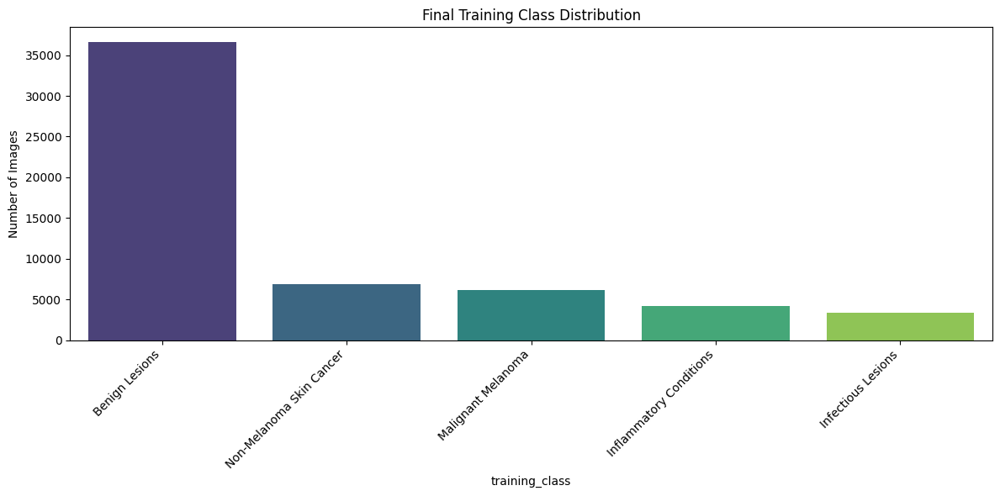

Processed data saved to '/content/processed_full_skin_data.csv'
Train: 40105, Validation: 8594, Test: 8594
Dataset created with 40105 images and 5 classes
Dataset created with 8594 images and 5 classes
Dataset created with 8594 images and 5 classes

Class to index mapping:
0: Benign Lesions
1: Infectious Lesions
2: Inflammatory Conditions
3: Malignant Melanoma
4: Non-Melanoma Skin Cancer

Visualizing a batch of training images:


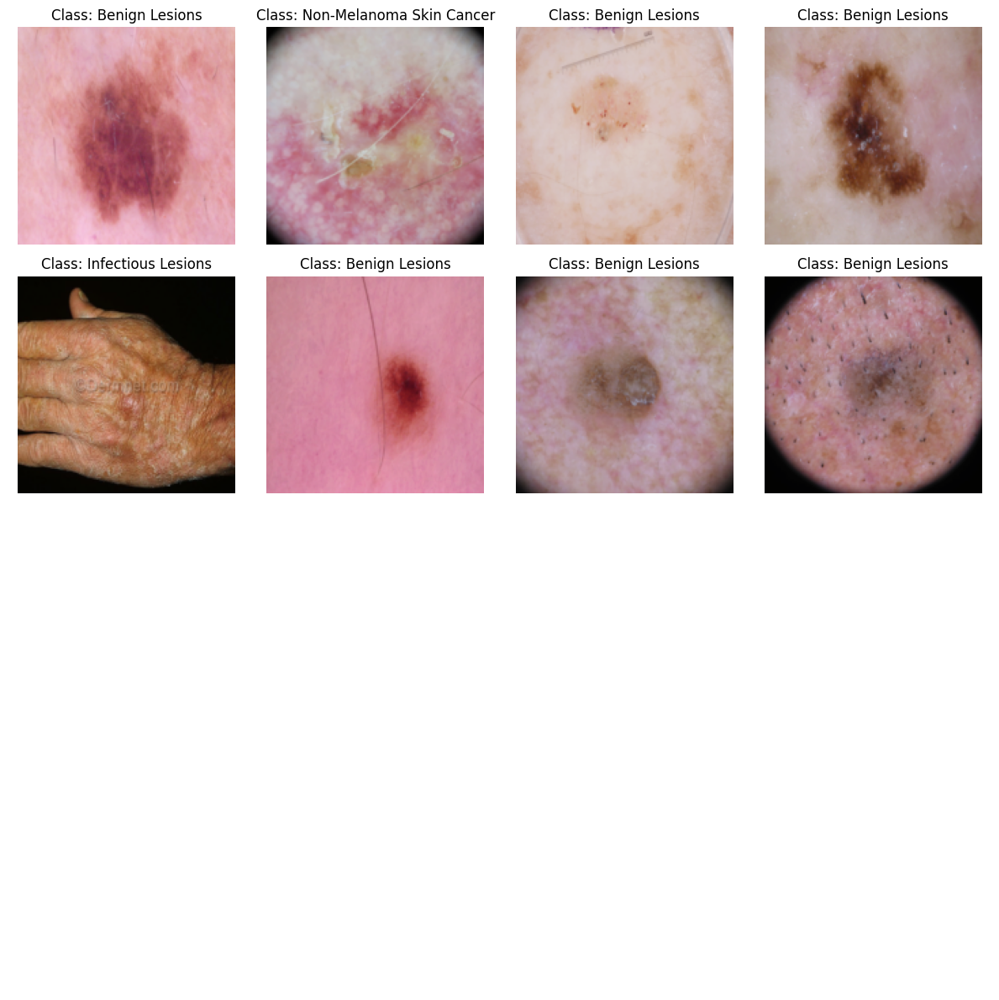

Downloading: "https://download.pytorch.org/models/resnet50-0676ba61.pth" to /root/.cache/torch/hub/checkpoints/resnet50-0676ba61.pth
100%|██████████| 97.8M/97.8M [00:00<00:00, 194MB/s]


----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 64, 112, 112]           9,408
       BatchNorm2d-2         [-1, 64, 112, 112]             128
              ReLU-3         [-1, 64, 112, 112]               0
         MaxPool2d-4           [-1, 64, 56, 56]               0
            Conv2d-5           [-1, 64, 56, 56]           4,096
       BatchNorm2d-6           [-1, 64, 56, 56]             128
              ReLU-7           [-1, 64, 56, 56]               0
            Conv2d-8           [-1, 64, 56, 56]          36,864
       BatchNorm2d-9           [-1, 64, 56, 56]             128
             ReLU-10           [-1, 64, 56, 56]               0
           Conv2d-11          [-1, 256, 56, 56]          16,384
      BatchNorm2d-12          [-1, 256, 56, 56]             512
           Conv2d-13          [-1, 256, 56, 56]          16,384
      BatchNorm2d-14          [-1, 256,

In [ ]:
# ==============================
# 🏷️ Step 9: Create Training Classes
# ==============================

def create_training_classes(df, min_samples=50):
    """Create training classes based on the full taxonomy"""
    print("Creating training classes based on full taxonomy...")

    # Check if df is empty
    if len(df) == 0:
        print("Error: Empty dataframe provided")
        return df

    # Check if required columns exist
    required_cols = ['severity', 'disease_category']
    missing_cols = [col for col in required_cols if col not in df.columns]
    if missing_cols:
        print(f"Error: Missing columns: {missing_cols}")
        return df

    # Initialize training_class with most detailed level: disease_category
    df['training_class'] = df['disease_category']

    # Get class distribution
    class_counts = df['training_class'].value_counts()
    print("\nInitial class distribution:")
    for cls, count in class_counts.items():
        print(f"  {cls}: {count} images ({count/len(df)*100:.1f}%)")

    # Filter out classes with too few samples
    small_classes = class_counts[class_counts < min_samples].index.tolist()

    # Map small classes to their parent classes (severity)
    if small_classes:
        print(f"\nMerging {len(small_classes)} small classes (< {min_samples} samples)...")
        for small_class in small_classes:
            # Find samples with the small class
            mask = (df['training_class'] == small_class)
            # Change their training class to the parent category (severity)
            severity_for_class = df.loc[mask, 'severity'].iloc[0] if sum(mask) > 0 else "Minor Conditions"
            df.loc[mask, 'training_class'] = f"{severity_for_class} - Other"

    # Print updated distribution
    class_counts = df['training_class'].value_counts()
    print("\nFinal training class distribution:")
    for cls, count in class_counts.items():
        print(f"  {cls}: {count} images ({count/len(df)*100:.1f}%)")

    # Visualize final class distribution
    plt.figure(figsize=(12, 6))
    sns.barplot(x=class_counts.index, y=class_counts.values, palette='viridis')
    plt.title('Final Training Class Distribution')
    plt.xticks(rotation=45, ha='right')
    plt.ylabel('Number of Images')
    plt.tight_layout()
    plt.show()

    return df

# Create training classes
classified_df = create_training_classes(filtered_df, min_samples=30)  # Lower threshold for demonstration

# Save the processed data
classified_df.to_csv('/content/processed_full_skin_data.csv', index=False)
print("Processed data saved to '/content/processed_full_skin_data.csv'")

# ==============================
# 📊 Step 10: Dataset and DataLoader Setup
# ==============================

class SkinLesionDataset(Dataset):
    """Dataset class for skin lesion images"""
    def __init__(self, dataframe, transform=None, cache_size=100):
        self.dataframe = dataframe
        self.transform = transform
        self.cache = {}  # Simple cache
        self.cache_size = cache_size

        # Create class mapping
        self.classes = sorted(dataframe['training_class'].unique())
        self.class_to_idx = {cls: idx for idx, cls in enumerate(self.classes)}

        # Map training classes to indices
        self.dataframe['class_idx'] = self.dataframe['training_class'].map(self.class_to_idx)

        print(f"Dataset created with {len(self.dataframe)} images and {len(self.classes)} classes")

    def __len__(self):
        return len(self.dataframe)

    def __getitem__(self, idx):
        img_path = self.dataframe.iloc[idx]['image_path']
        class_idx = self.dataframe.iloc[idx]['class_idx']

        # Check cache first
        if img_path in self.cache:
            img = self.cache[img_path]
        else:
            try:
                img = Image.open(img_path).convert('RGB')
                # Add to cache if not too large
                if len(self.cache) < self.cache_size:
                    self.cache[img_path] = img
            except Exception as e:
                img = Image.new('RGB', (160, 160), color='black')

        # Apply transformations
        if self.transform:
            img = self.transform(img)

        return img, class_idx

# Update your data transforms for better data quality
def get_transforms(image_size):
    """Get train and validation/test transforms with specified image size"""
    train_transform = transforms.Compose([
        transforms.Resize((160, 160)),  # Fixed size for consistency
        transforms.RandomHorizontalFlip(),
        transforms.RandomVerticalFlip(),
        transforms.ColorJitter(brightness=0.1, contrast=0.1),
        transforms.ToTensor(),
        transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
    ])

    val_test_transform = transforms.Compose([
        transforms.Resize((160, 160)),  # Same size as training
        transforms.ToTensor(),
        transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
    ])

    return train_transform, val_test_transform

def create_data_loaders(df, batch_size=32, image_size=224):
    """Create training, validation, and test data loaders"""
    # Check if dataframe is empty or missing required columns
    if len(df) == 0:
        raise ValueError("Empty dataframe provided")

    if 'training_class' not in df.columns:
        raise ValueError("Missing 'training_class' column")

    # Split data into train, validation, and test sets
    train_df, temp_df = train_test_split(
        df, test_size=0.3, random_state=42, stratify=df['training_class']
    )

    val_df, test_df = train_test_split(
        temp_df, test_size=0.5, random_state=42, stratify=temp_df['training_class']
    )

    print(f"Train: {len(train_df)}, Validation: {len(val_df)}, Test: {len(test_df)}")

    # Get transforms
    train_transform, val_test_transform = get_transforms(image_size)

    # Create datasets
    train_dataset = SkinLesionDataset(train_df, transform=train_transform)
    val_dataset = SkinLesionDataset(val_df, transform=val_test_transform)
    test_dataset = SkinLesionDataset(test_df, transform=val_test_transform)


    # Create data loaders
    train_loader = DataLoader(
        train_dataset,
        batch_size=8,
        shuffle=True,
        num_workers=2,
        pin_memory=True
    )

    val_loader = DataLoader(
        val_dataset,
        batch_size=8,
        num_workers=2,
        pin_memory=True
    )
    test_loader = DataLoader(test_dataset, batch_size=batch_size, num_workers=2, pin_memory=True)

    return train_loader, val_loader, test_loader, train_dataset.classes, train_df

# Configure settings
IMAGE_SIZE = 224  # Set to 299 for Inception v3, 224 for others
BATCH_SIZE = 32   # Adjust based on GPU memory

# Create data loaders
train_loader, val_loader, test_loader, class_names, train_df = create_data_loaders(
    classified_df, batch_size=BATCH_SIZE, image_size=IMAGE_SIZE
)

# Display class names and their indices
print("\nClass to index mapping:")
for idx, class_name in enumerate(class_names):
    print(f"{idx}: {class_name}")

# Visualize a batch of training data
def show_batch(dataloader, class_names):
    """Display a batch of images with their labels"""
    images, labels = next(iter(dataloader))
    batch_size = len(images)
    grid_size = min(4, batch_size)  # Show at most 4x4 grid

    fig, axes = plt.subplots(grid_size, grid_size, figsize=(12, 12))

    for i, ax in enumerate(axes.flat):
        if i < batch_size:
            # Un-normalize the image
            img = images[i].numpy().transpose((1, 2, 0))
            mean = np.array([0.485, 0.456, 0.406])
            std = np.array([0.229, 0.224, 0.225])
            img = std * img + mean
            img = np.clip(img, 0, 1)

            ax.imshow(img)
            ax.set_title(f"Class: {class_names[labels[i]]}")
            ax.axis('off')
        else:
            ax.axis('off')

    plt.tight_layout()
    plt.show()

# Show a batch of training images
print("\nVisualizing a batch of training images:")
show_batch(train_loader, class_names)

# ==============================
# 🧠 Step 11: Model Architecture
# ==============================

def create_model(model_type, num_classes, pretrained=True):
    """Create model based on specified type"""
    print(f"Creating {model_type} model with {num_classes} classes...")

    if model_type == "inception_v3":
        # Inception v3 requires 299x299 minimum input size
        model = models.inception_v3(pretrained=pretrained)

        # Modify main classifier
        in_features = model.fc.in_features
        model.fc = nn.Linear(in_features, num_classes)

        # Modify auxiliary classifier
        if hasattr(model, 'AuxLogits') and hasattr(model.AuxLogits, 'fc'):
            aux_in_features = model.AuxLogits.fc.in_features
            model.AuxLogits.fc = nn.Linear(aux_in_features, num_classes)

    elif model_type == "resnet50":
        # ResNet50 - more robust alternative
        model = models.resnet50(pretrained=pretrained)
        in_features = model.fc.in_features
        model.fc = nn.Linear(in_features, num_classes)

    elif model_type == "mobilenet_v2":
        # MobileNetV2 - much faster than Inception or ResNet
        model = models.mobilenet_v2(pretrained=pretrained)
        # Replace classifier
        model.classifier[1] = nn.Linear(model.classifier[1].in_features, num_classes)

    elif model_type == "efficientnet":
        # EfficientNet - balance of accuracy and speed
        model = models.efficientnet_b0(pretrained=pretrained)
        in_features = model.classifier[1].in_features
        model.classifier = nn.Linear(in_features, num_classes)

    elif model_type == "densenet":
        # DenseNet - good for handling complex relationships
        model = models.densenet121(pretrained=pretrained)
        in_features = model.classifier.in_features
        model.classifier = nn.Linear(in_features, num_classes)

    else:
        raise ValueError(f"Unsupported model type: {model_type}")

    return model

def create_memory_efficient_resnet50(num_classes):
    # Load pretrained model
    model = models.resnet50(pretrained=True)


    # Modify the final layer for your number of classes
    model.fc = nn.Linear(model.fc.in_features, num_classes)

    # Keep your existing checkpointing code
    def forward_with_checkpoint(self, x):
        x = self.conv1(x)
        x = self.bn1(x)
        x = self.relu(x)
        x = self.maxpool(x)

        # Apply checkpointing to individual blocks for better memory efficiency
        for block in self.layer1:
            x = checkpoint(block, x)
        for block in self.layer2:
            x = checkpoint(block, x)
        for block in self.layer3:
            x = checkpoint(block, x)
        for block in self.layer4:
            x = checkpoint(block, x)

        x = self.avgpool(x)
        x = torch.flatten(x, 1)
        x = self.fc(x)
        return x

    # Replace the forward method
    model.forward = types.MethodType(forward_with_checkpoint, model)
    return model

# Define model parameters
MODEL_TYPE = "resnet50"  # Options: "inception_v3", "resnet50", "mobilenet_v2", "efficientnet", "densenet"
NUM_EPOCHS = 40         # Use a lower value for demonstration

# Create model
num_classes = len(class_names)
model = create_memory_efficient_resnet50(num_classes=len(class_names))
model = model.to(device)


# Print model summary (optionally, if torchsummary is installed)
try:
    from torchsummary import summary
    summary(model, input_size=(3, IMAGE_SIZE, IMAGE_SIZE))
except ImportError:
    print("torchsummary not installed. Skipping model summary.")
    print(f"Model: {MODEL_TYPE} with {num_classes} output classes")


Creating weighted loss with focus on medically important classes
  Benign Lesions: 1.00
  Infectious Lesions: 1.00
  Inflammatory Conditions: 1.50 (inflammatory emphasis)
  Malignant Melanoma: 1.00 (dangerous emphasis)
  Non-Melanoma Skin Cancer: 1.00 (dangerous emphasis)
Epoch 1/40
--------------------


train: 100%|██████████| 5014/5014 [04:38<00:00, 18.02it/s]


train Loss: 0.7569 Acc: 0.7086


val: 100%|██████████| 1075/1075 [00:44<00:00, 24.01it/s]


val Loss: 0.7303 Acc: 0.7196

Epoch 2/40
--------------------


train: 100%|██████████| 5014/5014 [04:36<00:00, 18.15it/s]


train Loss: 0.7267 Acc: 0.7218


val: 100%|██████████| 1075/1075 [00:44<00:00, 24.40it/s]


val Loss: 0.7172 Acc: 0.7335


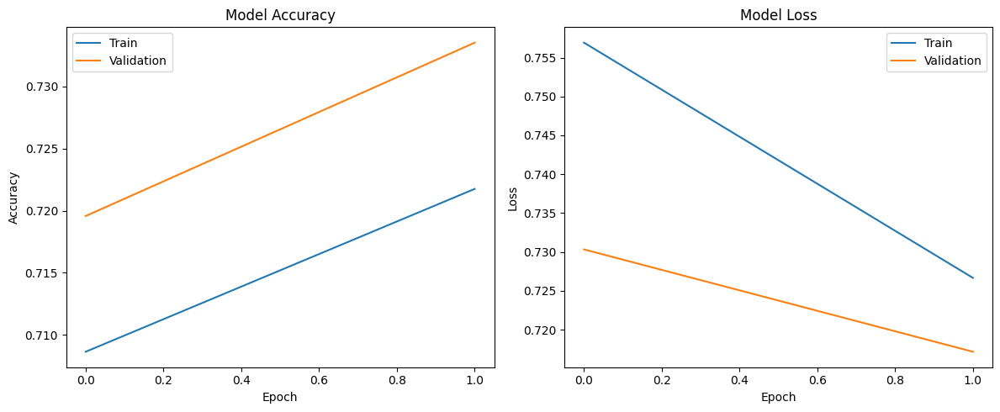


Epoch 3/40
--------------------


train: 100%|██████████| 5014/5014 [04:41<00:00, 17.84it/s]


train Loss: 0.7053 Acc: 0.7283


val: 100%|██████████| 1075/1075 [00:44<00:00, 24.10it/s]


val Loss: 0.6971 Acc: 0.7389


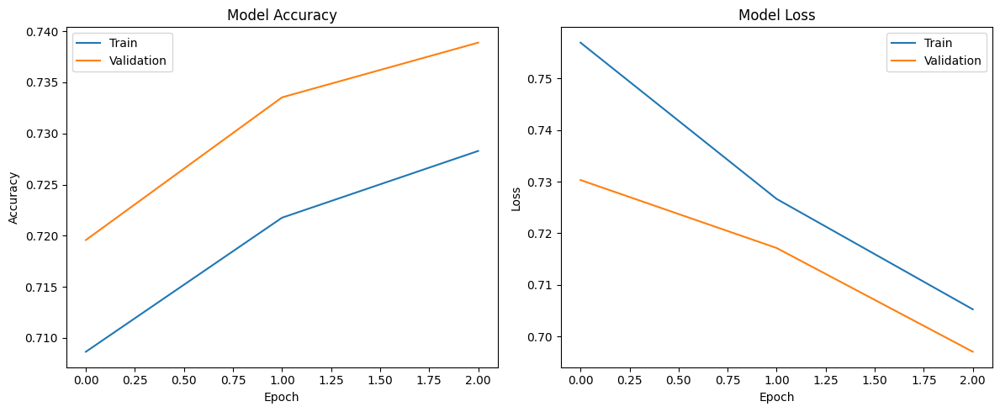


Epoch 4/40
--------------------


train: 100%|██████████| 5014/5014 [04:44<00:00, 17.64it/s]


train Loss: 0.6874 Acc: 0.7347


val: 100%|██████████| 1075/1075 [00:44<00:00, 23.97it/s]


val Loss: 0.7198 Acc: 0.7360


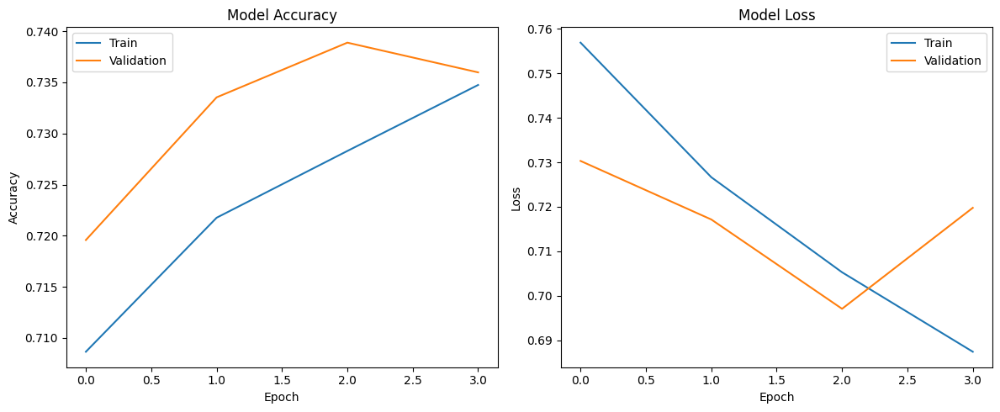


Epoch 5/40
--------------------


train: 100%|██████████| 5014/5014 [04:40<00:00, 17.91it/s]


train Loss: 0.6705 Acc: 0.7448


val: 100%|██████████| 1075/1075 [00:44<00:00, 24.06it/s]


val Loss: 0.7146 Acc: 0.7430


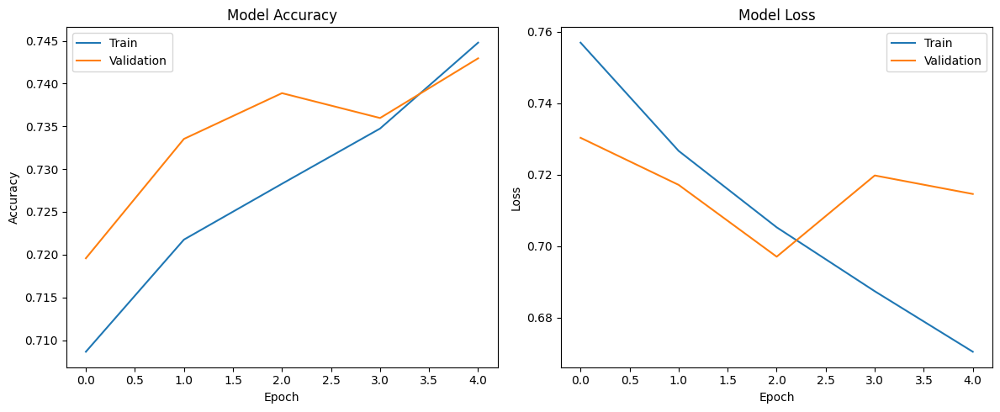


Epoch 6/40
--------------------


train: 100%|██████████| 5014/5014 [04:38<00:00, 17.98it/s]


train Loss: 0.6522 Acc: 0.7505


val: 100%|██████████| 1075/1075 [00:44<00:00, 23.95it/s]


val Loss: 0.6791 Acc: 0.7433


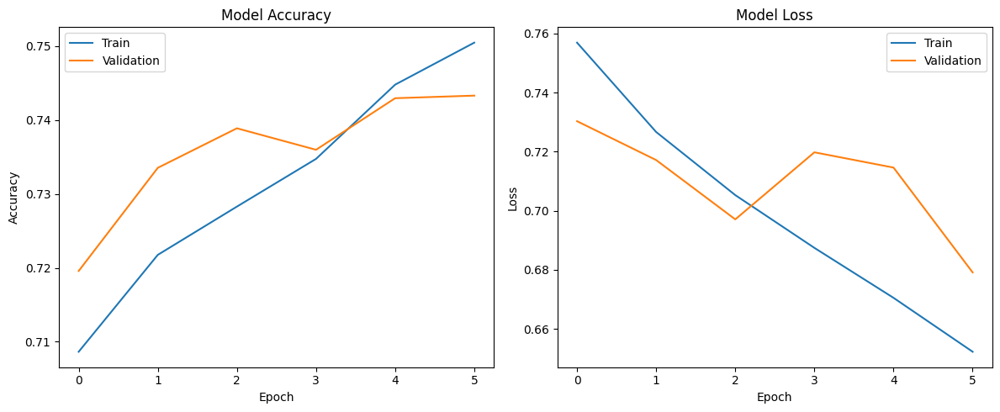


Epoch 7/40
--------------------


train: 100%|██████████| 5014/5014 [04:40<00:00, 17.90it/s]


train Loss: 0.6391 Acc: 0.7549


val: 100%|██████████| 1075/1075 [00:44<00:00, 24.07it/s]


val Loss: 0.7074 Acc: 0.7440


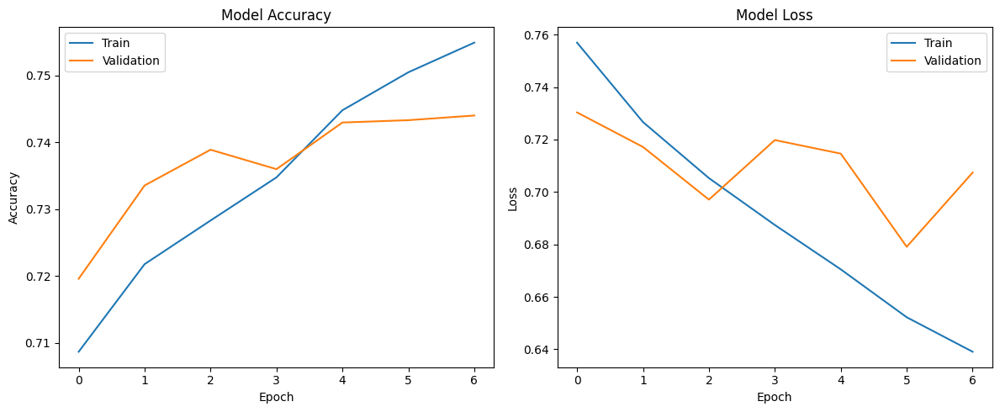


Epoch 8/40
--------------------


train: 100%|██████████| 5014/5014 [04:40<00:00, 17.85it/s]


train Loss: 0.6263 Acc: 0.7615


val: 100%|██████████| 1075/1075 [00:44<00:00, 24.04it/s]


val Loss: 0.7503 Acc: 0.7432


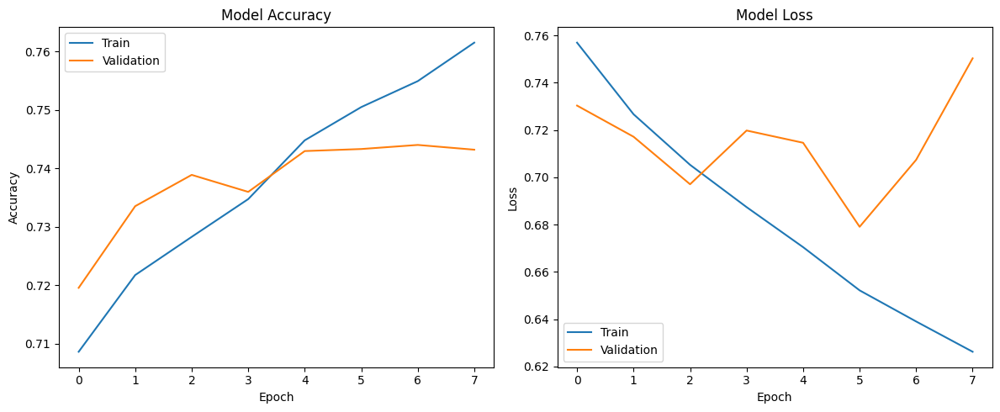


Epoch 9/40
--------------------


train: 100%|██████████| 5014/5014 [04:42<00:00, 17.76it/s]


train Loss: 0.6151 Acc: 0.7650


val: 100%|██████████| 1075/1075 [00:44<00:00, 24.06it/s]


val Loss: 0.6367 Acc: 0.7667


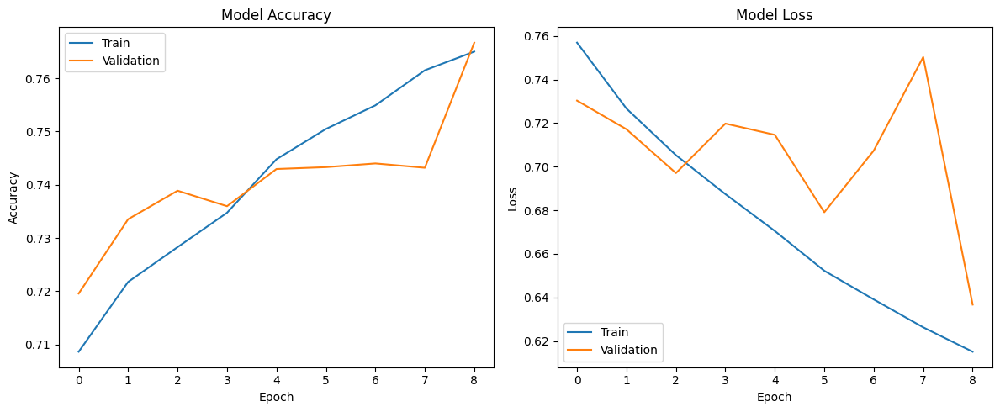


Epoch 10/40
--------------------


train: 100%|██████████| 5014/5014 [04:40<00:00, 17.85it/s]


train Loss: 0.6009 Acc: 0.7715


val: 100%|██████████| 1075/1075 [00:44<00:00, 24.04it/s]


val Loss: 0.7030 Acc: 0.7558


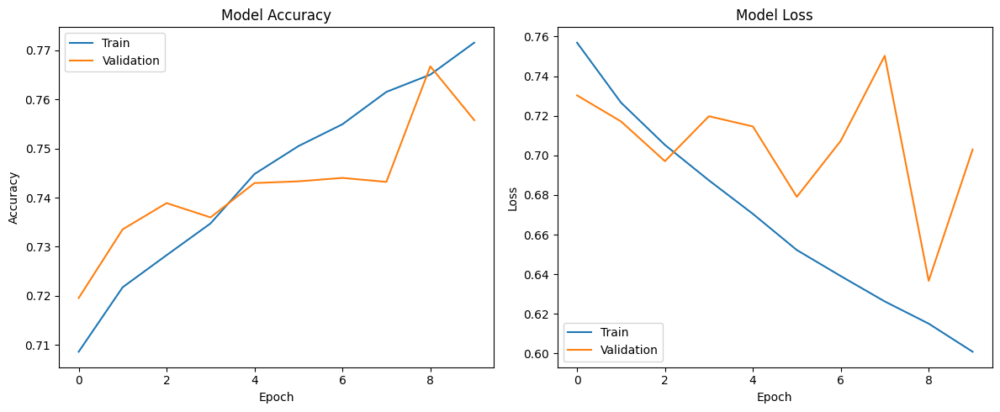


Epoch 11/40
--------------------


train: 100%|██████████| 5014/5014 [04:43<00:00, 17.68it/s]


train Loss: 0.5909 Acc: 0.7747


val: 100%|██████████| 1075/1075 [00:44<00:00, 23.93it/s]


val Loss: 0.6552 Acc: 0.7645


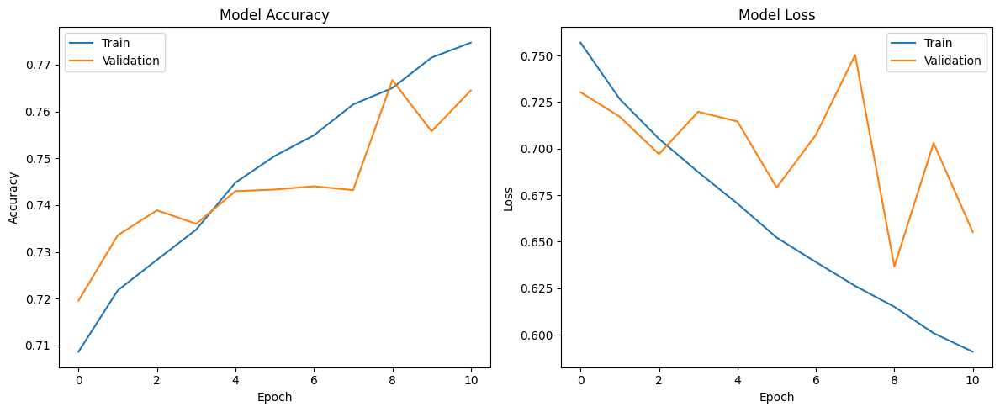


Epoch 12/40
--------------------


train: 100%|██████████| 5014/5014 [04:41<00:00, 17.80it/s]


train Loss: 0.5801 Acc: 0.7784


val: 100%|██████████| 1075/1075 [00:45<00:00, 23.89it/s]


val Loss: 0.7000 Acc: 0.7605


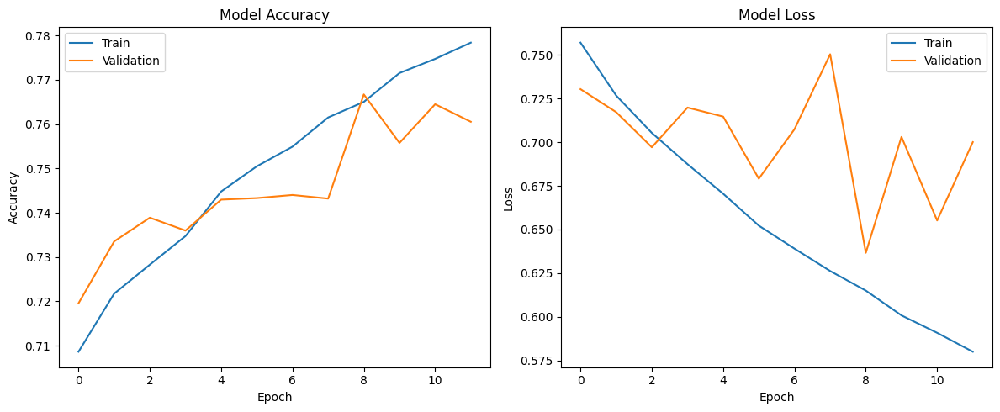


Epoch 13/40
--------------------


train: 100%|██████████| 5014/5014 [04:43<00:00, 17.68it/s]


train Loss: 0.5678 Acc: 0.7837


val: 100%|██████████| 1075/1075 [00:45<00:00, 23.55it/s]


val Loss: 0.6720 Acc: 0.7608


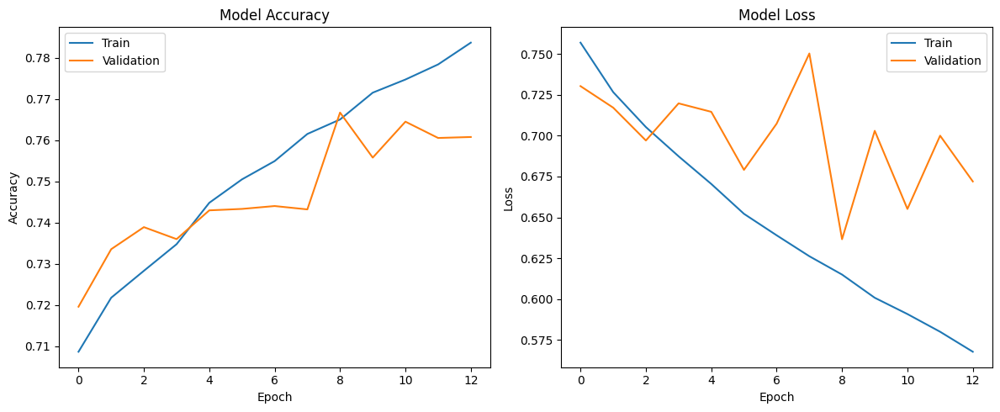


Epoch 14/40
--------------------


train: 100%|██████████| 5014/5014 [04:45<00:00, 17.59it/s]


train Loss: 0.5594 Acc: 0.7875


val: 100%|██████████| 1075/1075 [00:45<00:00, 23.75it/s]


val Loss: 0.6087 Acc: 0.7780


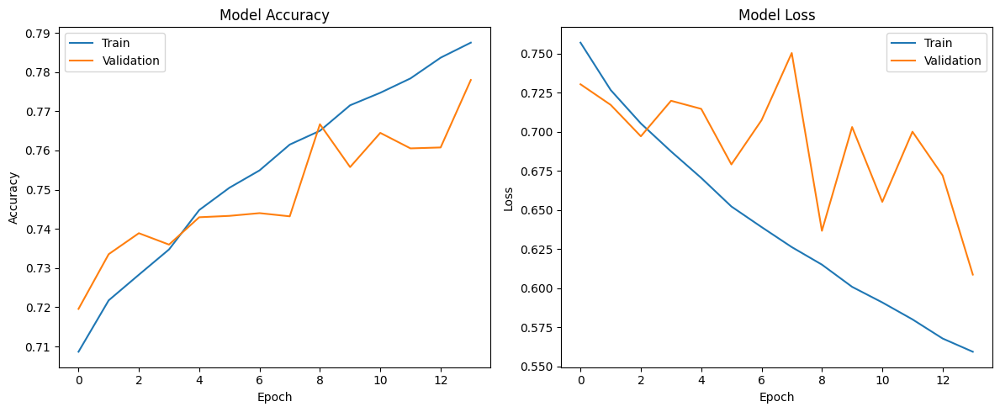


Epoch 15/40
--------------------


train: 100%|██████████| 5014/5014 [04:44<00:00, 17.65it/s]


train Loss: 0.5495 Acc: 0.7919


val: 100%|██████████| 1075/1075 [00:44<00:00, 23.93it/s]


val Loss: 0.6963 Acc: 0.7661


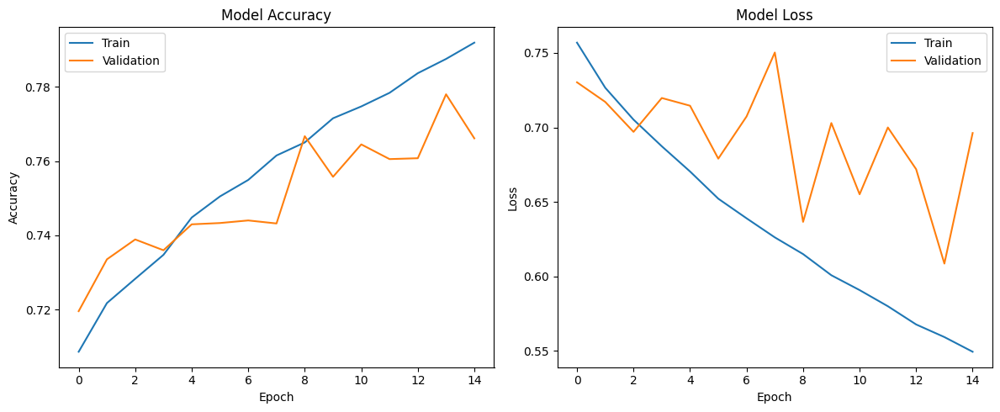


Epoch 16/40
--------------------


train: 100%|██████████| 5014/5014 [04:39<00:00, 17.94it/s]


train Loss: 0.5397 Acc: 0.7952


val: 100%|██████████| 1075/1075 [00:44<00:00, 23.93it/s]


val Loss: 0.6213 Acc: 0.7808


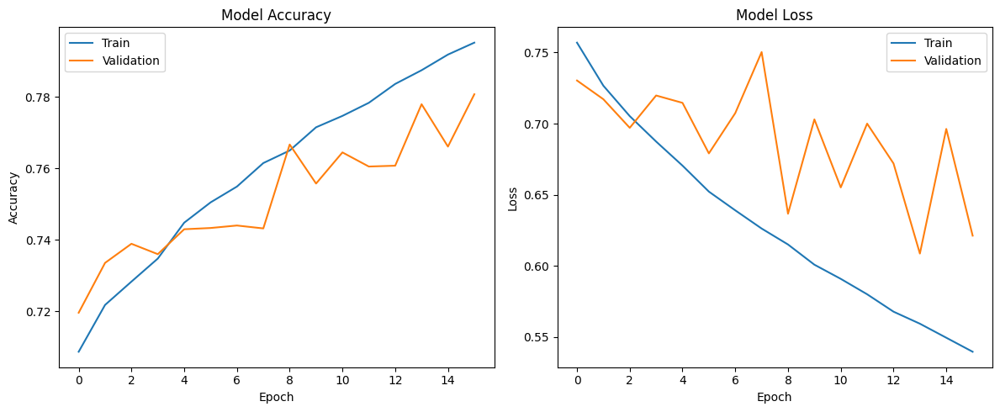


Epoch 17/40
--------------------


train: 100%|██████████| 5014/5014 [04:40<00:00, 17.89it/s]


train Loss: 0.5270 Acc: 0.7997


val: 100%|██████████| 1075/1075 [00:45<00:00, 23.85it/s]


val Loss: 0.6676 Acc: 0.7730


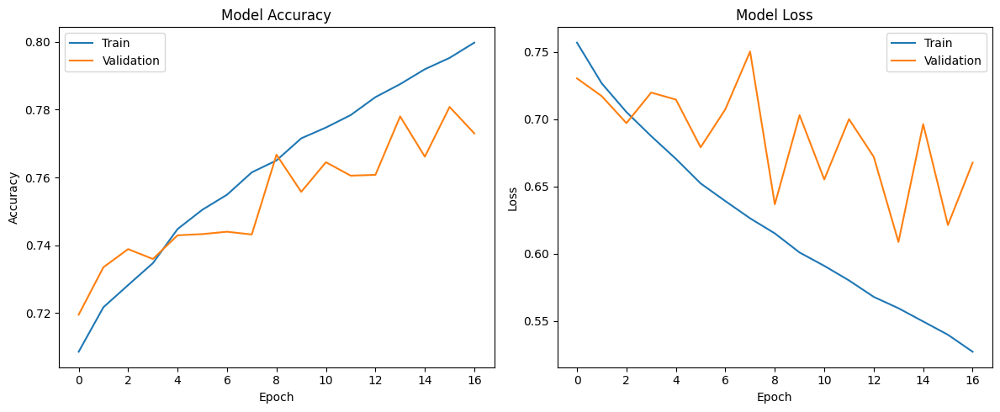


Epoch 18/40
--------------------


train: 100%|██████████| 5014/5014 [04:42<00:00, 17.77it/s]


train Loss: 0.5137 Acc: 0.8065


val: 100%|██████████| 1075/1075 [00:44<00:00, 24.04it/s]


val Loss: 0.6913 Acc: 0.7681


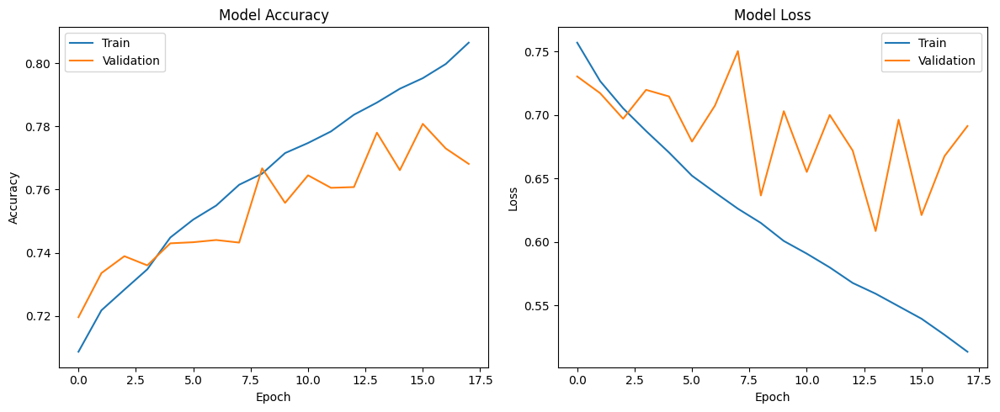


Epoch 19/40
--------------------


train: 100%|██████████| 5014/5014 [04:41<00:00, 17.84it/s]


train Loss: 0.5086 Acc: 0.8092


val: 100%|██████████| 1075/1075 [00:44<00:00, 24.01it/s]


val Loss: 0.6607 Acc: 0.7776


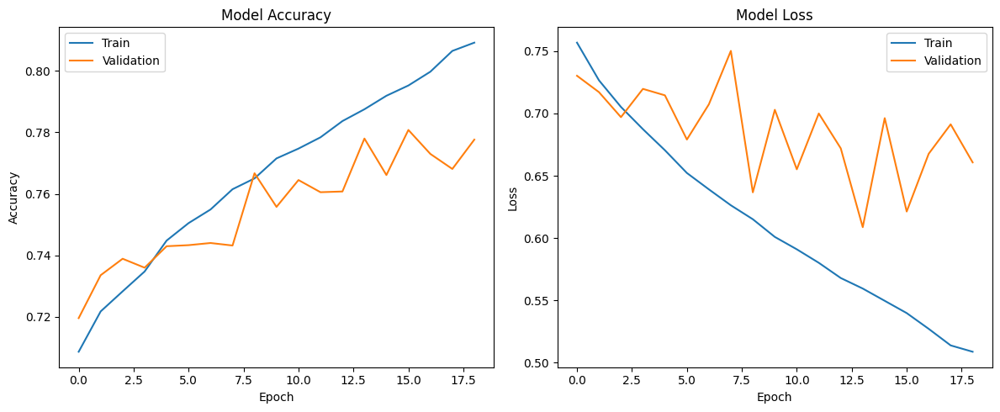


Epoch 20/40
--------------------


train: 100%|██████████| 5014/5014 [04:40<00:00, 17.90it/s]


train Loss: 0.4944 Acc: 0.8149


val: 100%|██████████| 1075/1075 [00:45<00:00, 23.72it/s]


val Loss: 0.6170 Acc: 0.7837


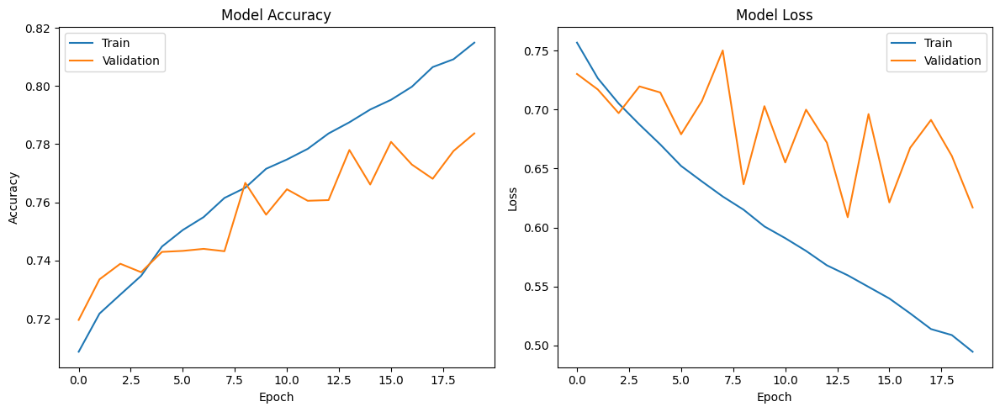


Epoch 21/40
--------------------


train: 100%|██████████| 5014/5014 [04:36<00:00, 18.15it/s]


train Loss: 0.4863 Acc: 0.8167


val: 100%|██████████| 1075/1075 [00:45<00:00, 23.83it/s]


val Loss: 0.6953 Acc: 0.7682


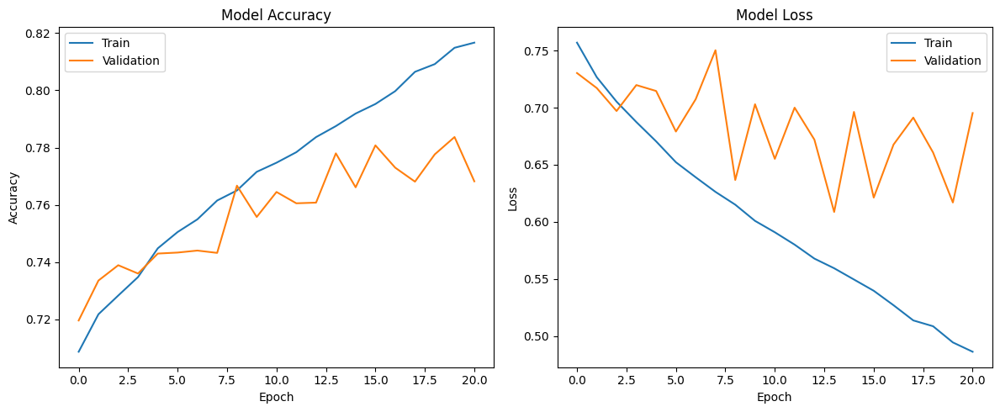


Epoch 22/40
--------------------


train: 100%|██████████| 5014/5014 [04:36<00:00, 18.12it/s]


train Loss: 0.4790 Acc: 0.8211


val: 100%|██████████| 1075/1075 [00:45<00:00, 23.78it/s]


val Loss: 0.6227 Acc: 0.7839


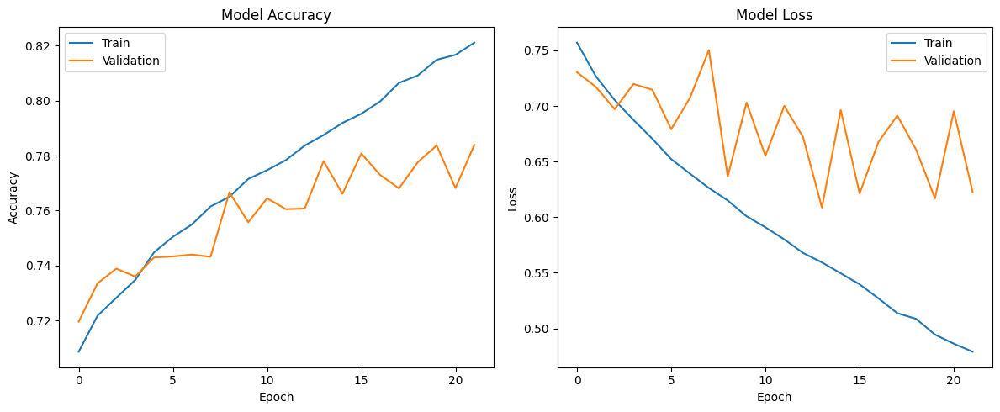


Epoch 23/40
--------------------


train: 100%|██████████| 5014/5014 [04:40<00:00, 17.87it/s]


train Loss: 0.4779 Acc: 0.8211


val: 100%|██████████| 1075/1075 [00:44<00:00, 24.17it/s]


val Loss: 0.6781 Acc: 0.7807


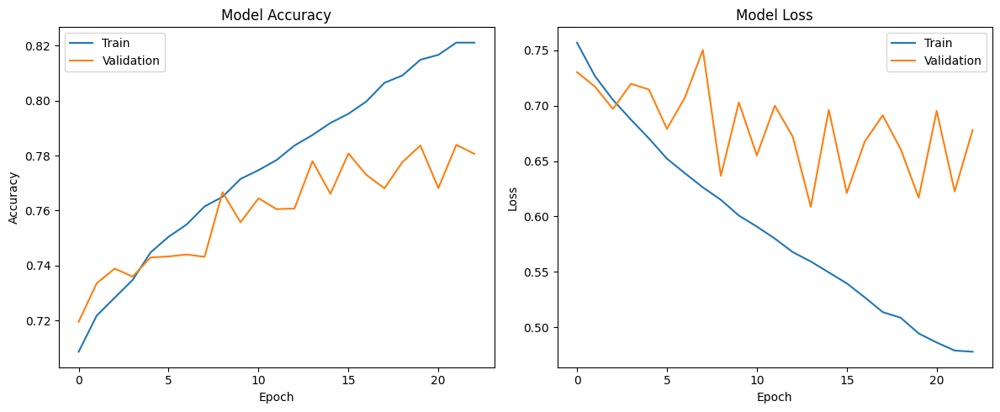


Epoch 24/40
--------------------


train: 100%|██████████| 5014/5014 [04:40<00:00, 17.89it/s]


train Loss: 0.4762 Acc: 0.8209


val: 100%|██████████| 1075/1075 [00:45<00:00, 23.70it/s]


val Loss: 0.6962 Acc: 0.7738


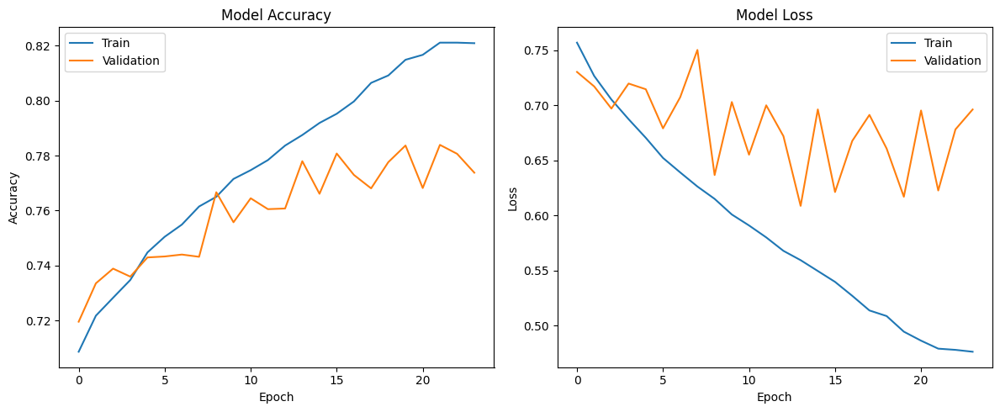


Epoch 25/40
--------------------


train: 100%|██████████| 5014/5014 [04:39<00:00, 17.94it/s]


train Loss: 0.4737 Acc: 0.8224


val: 100%|██████████| 1075/1075 [00:44<00:00, 23.92it/s]


val Loss: 0.6462 Acc: 0.7794


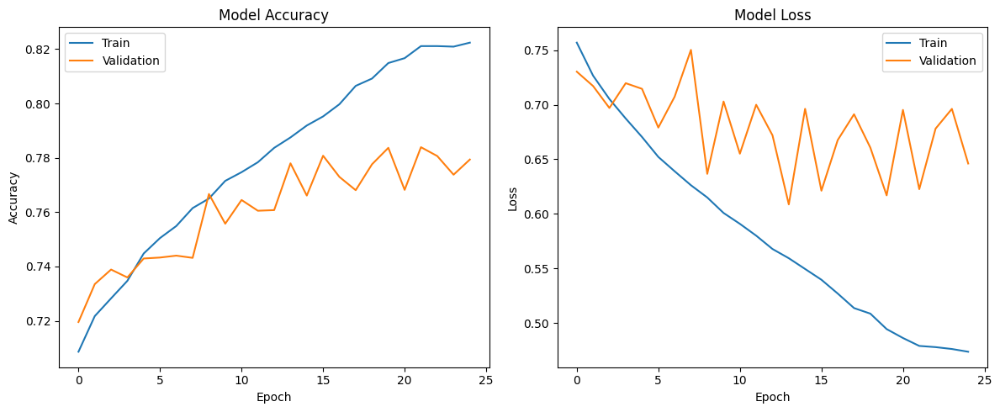


Epoch 26/40
--------------------


train: 100%|██████████| 5014/5014 [04:43<00:00, 17.67it/s]


train Loss: 0.4676 Acc: 0.8266


val: 100%|██████████| 1075/1075 [00:45<00:00, 23.53it/s]


val Loss: 0.6568 Acc: 0.7747


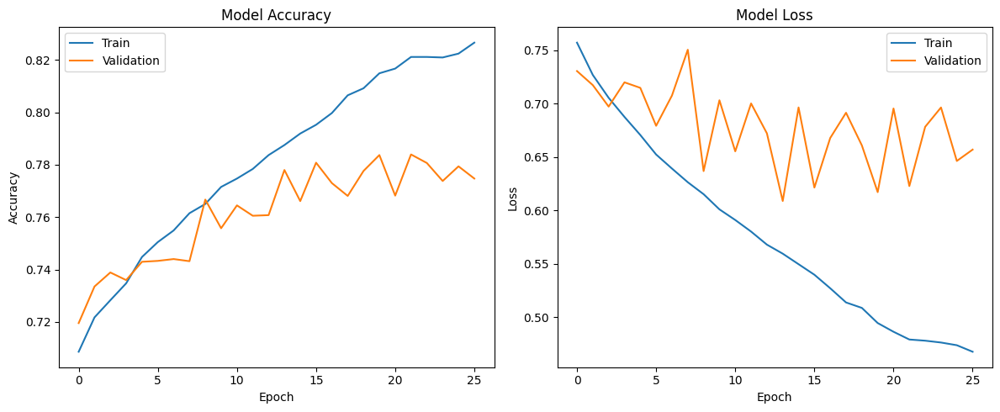


Epoch 27/40
--------------------


train: 100%|██████████| 5014/5014 [04:41<00:00, 17.83it/s]


train Loss: 0.4696 Acc: 0.8233


val: 100%|██████████| 1075/1075 [00:45<00:00, 23.50it/s]


val Loss: 0.6230 Acc: 0.7832


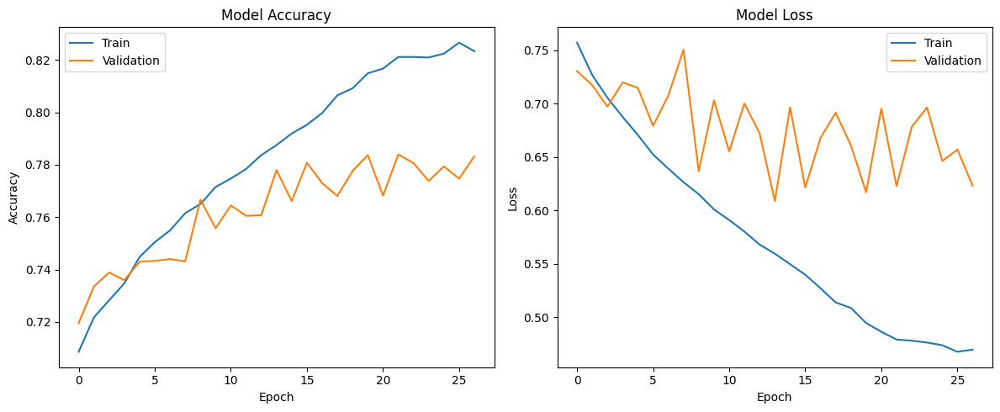


Epoch 28/40
--------------------


train: 100%|██████████| 5014/5014 [04:40<00:00, 17.85it/s]


train Loss: 0.4681 Acc: 0.8233


val: 100%|██████████| 1075/1075 [00:44<00:00, 23.90it/s]


val Loss: 0.6214 Acc: 0.7879


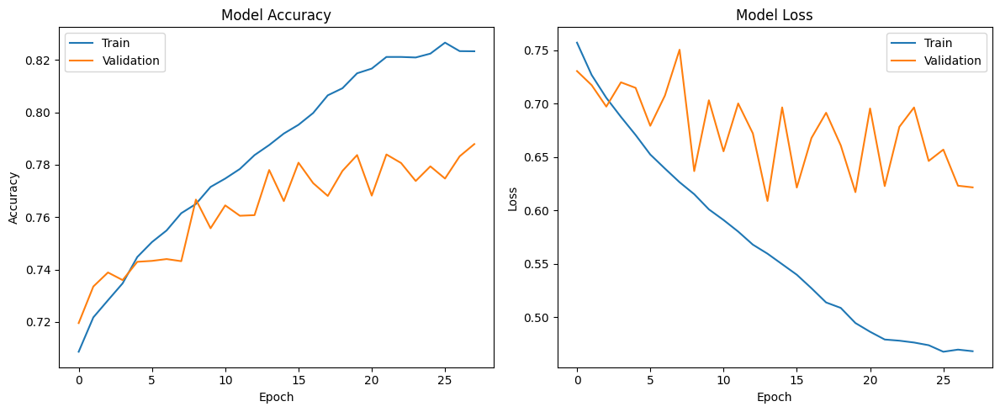


Epoch 29/40
--------------------


train: 100%|██████████| 5014/5014 [04:39<00:00, 17.92it/s]


train Loss: 0.4667 Acc: 0.8266


val: 100%|██████████| 1075/1075 [00:45<00:00, 23.56it/s]


val Loss: 0.6056 Acc: 0.7828


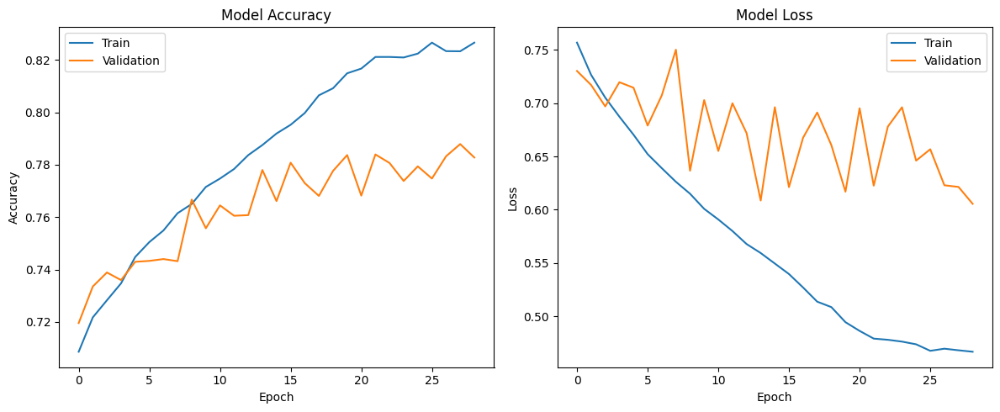


Epoch 30/40
--------------------


train: 100%|██████████| 5014/5014 [04:39<00:00, 17.94it/s]


train Loss: 0.4666 Acc: 0.8250


val: 100%|██████████| 1075/1075 [00:45<00:00, 23.79it/s]


val Loss: 0.6703 Acc: 0.7773


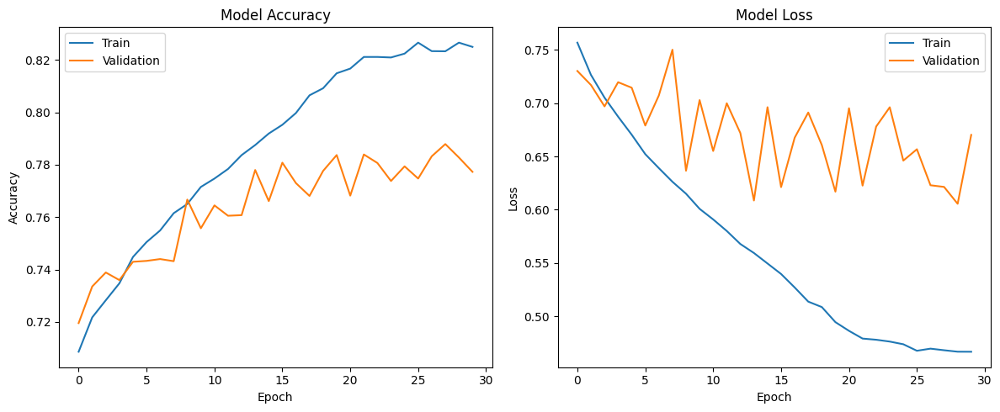


Epoch 31/40
--------------------


train: 100%|██████████| 5014/5014 [04:40<00:00, 17.87it/s]


train Loss: 0.4680 Acc: 0.8260


val: 100%|██████████| 1075/1075 [00:44<00:00, 24.16it/s]


val Loss: 0.6564 Acc: 0.7824


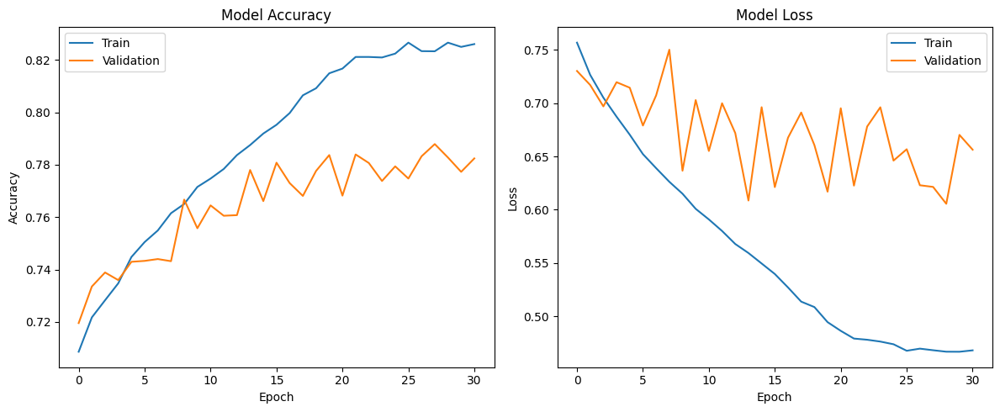


Epoch 32/40
--------------------


train: 100%|██████████| 5014/5014 [04:40<00:00, 17.87it/s]


train Loss: 0.4633 Acc: 0.8252


val: 100%|██████████| 1075/1075 [00:45<00:00, 23.86it/s]


val Loss: 0.6842 Acc: 0.7722


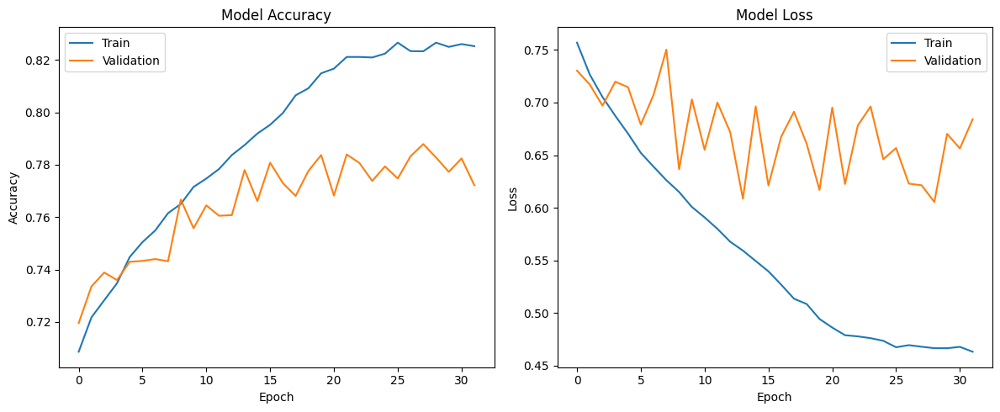


Epoch 33/40
--------------------


train: 100%|██████████| 5014/5014 [04:40<00:00, 17.89it/s]


train Loss: 0.4627 Acc: 0.8263


val: 100%|██████████| 1075/1075 [00:45<00:00, 23.88it/s]


val Loss: 0.6199 Acc: 0.7879


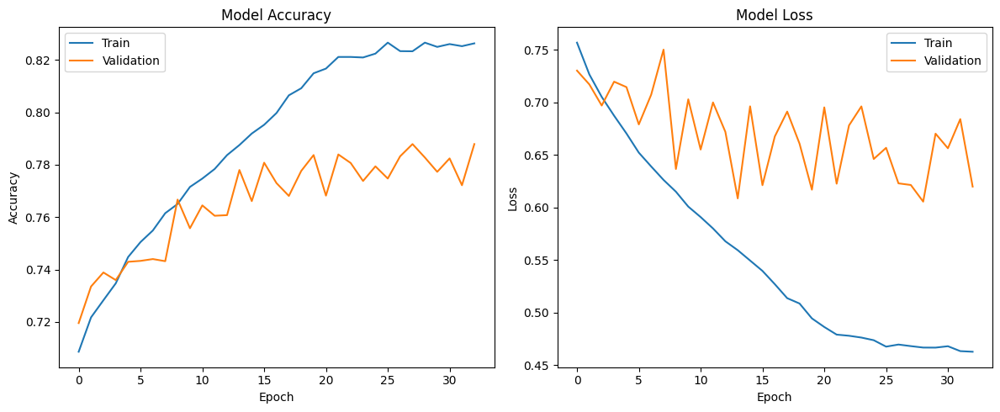


Epoch 34/40
--------------------


train: 100%|██████████| 5014/5014 [04:41<00:00, 17.83it/s]


train Loss: 0.4629 Acc: 0.8266


val: 100%|██████████| 1075/1075 [00:45<00:00, 23.83it/s]


val Loss: 0.6362 Acc: 0.7836


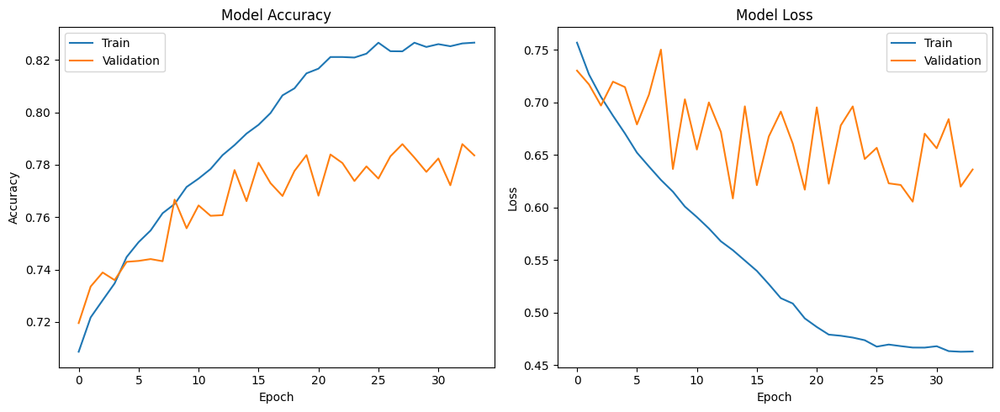


Epoch 35/40
--------------------


train: 100%|██████████| 5014/5014 [04:41<00:00, 17.81it/s]


train Loss: 0.4642 Acc: 0.8266


val: 100%|██████████| 1075/1075 [00:45<00:00, 23.58it/s]


val Loss: 0.7025 Acc: 0.7710


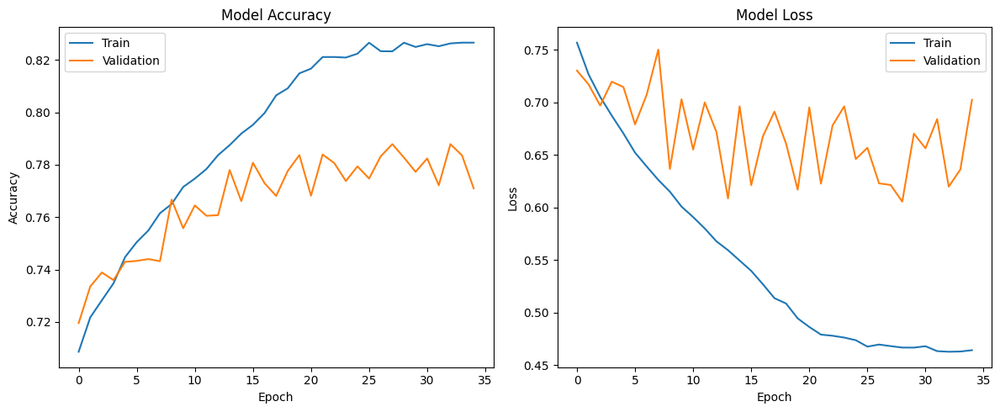


Epoch 36/40
--------------------


train: 100%|██████████| 5014/5014 [04:41<00:00, 17.78it/s]


train Loss: 0.4620 Acc: 0.8267


val: 100%|██████████| 1075/1075 [00:45<00:00, 23.52it/s]


val Loss: 0.6259 Acc: 0.7805


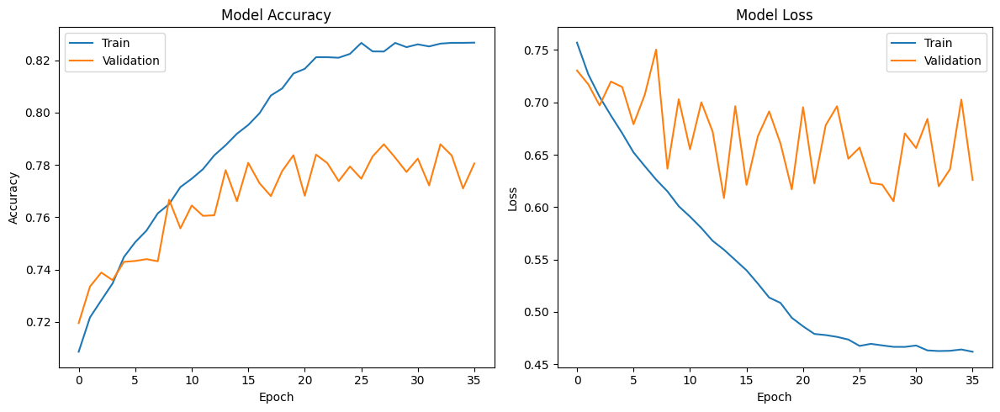


Epoch 37/40
--------------------


train: 100%|██████████| 5014/5014 [04:42<00:00, 17.76it/s]


train Loss: 0.4614 Acc: 0.8277


val: 100%|██████████| 1075/1075 [00:45<00:00, 23.87it/s]


val Loss: 0.6428 Acc: 0.7829


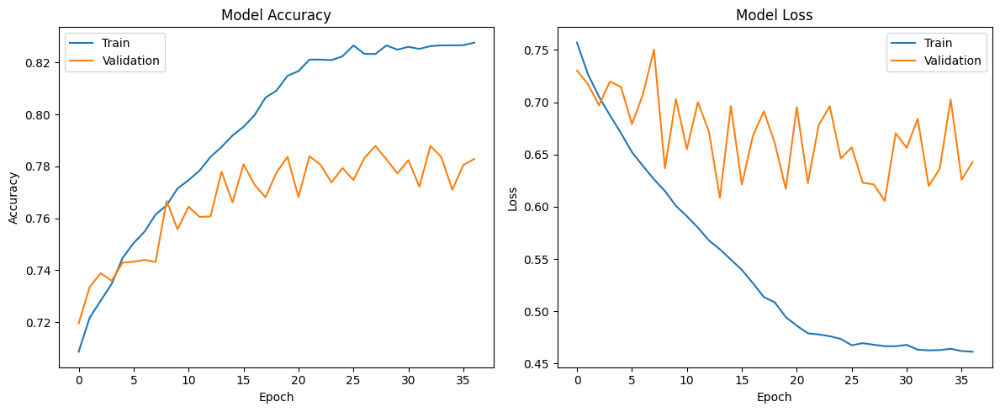


Epoch 38/40
--------------------


train: 100%|██████████| 5014/5014 [04:41<00:00, 17.78it/s]


train Loss: 0.4628 Acc: 0.8275


val: 100%|██████████| 1075/1075 [00:45<00:00, 23.80it/s]


val Loss: 0.6219 Acc: 0.7805


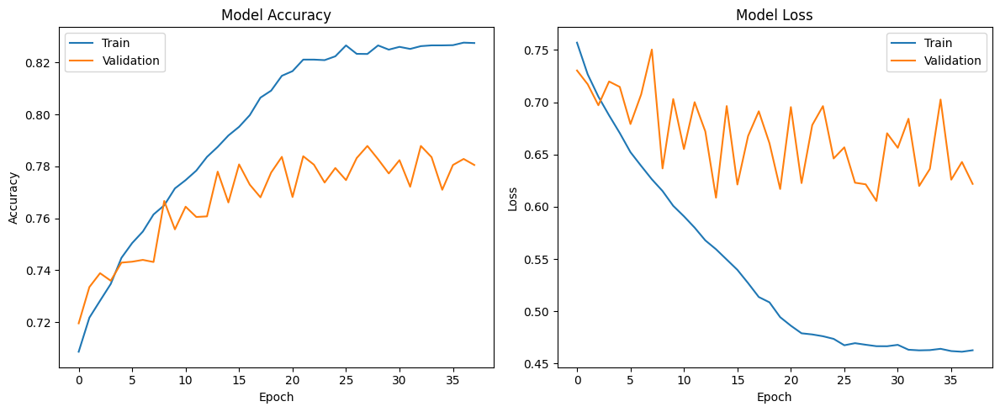


Epoch 39/40
--------------------


train: 100%|██████████| 5014/5014 [04:40<00:00, 17.86it/s]


train Loss: 0.4616 Acc: 0.8261


val: 100%|██████████| 1075/1075 [00:45<00:00, 23.88it/s]


val Loss: 0.6253 Acc: 0.7854


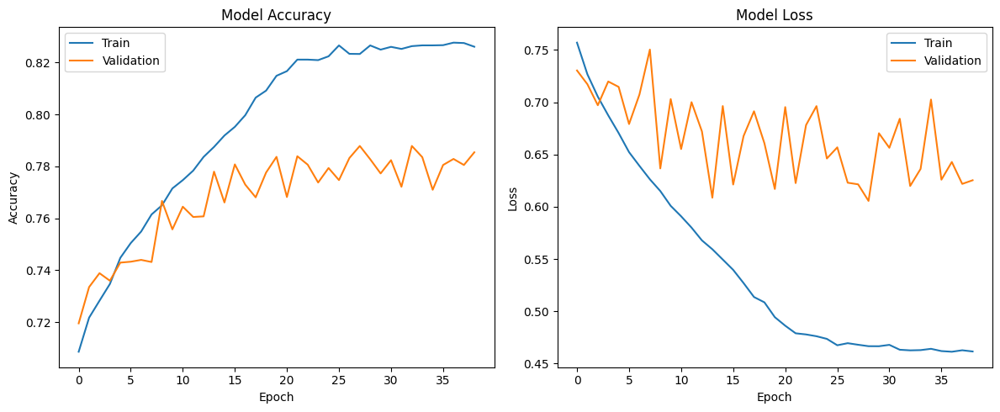


Epoch 40/40
--------------------


train: 100%|██████████| 5014/5014 [04:40<00:00, 17.85it/s]


train Loss: 0.4618 Acc: 0.8269


val: 100%|██████████| 1075/1075 [00:45<00:00, 23.80it/s]


val Loss: 0.7931 Acc: 0.7637


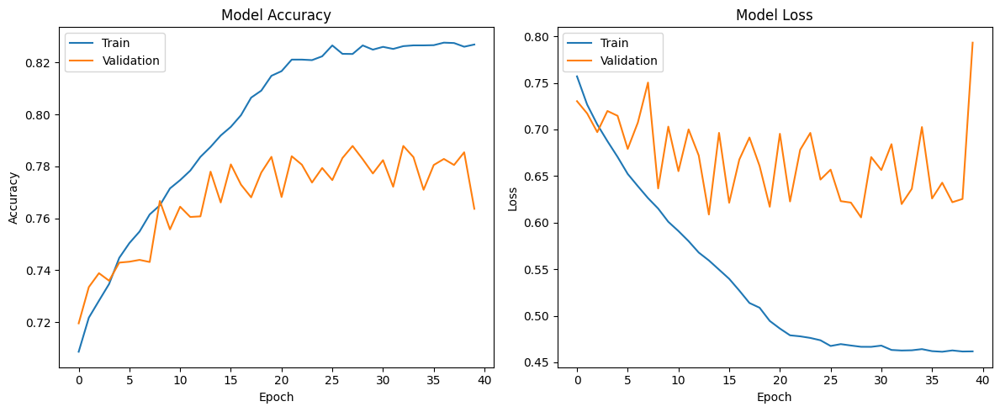


Training complete in 217m 31s
Best val Acc: 0.7879


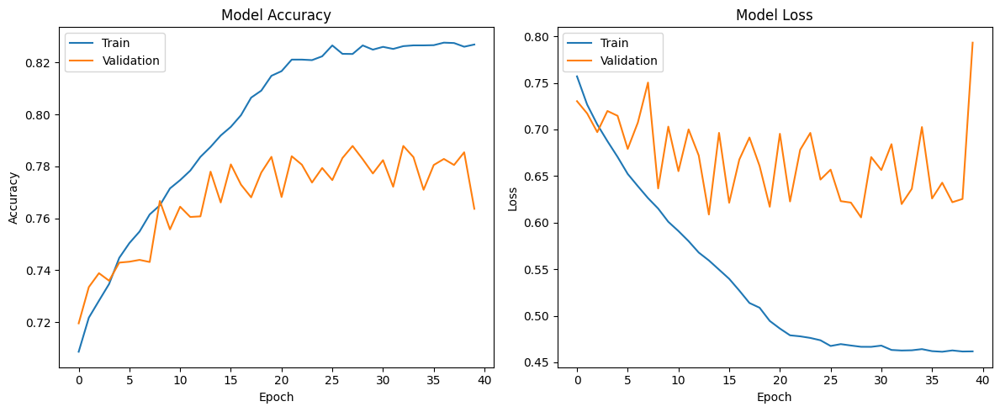

Evaluating: 100%|██████████| 269/269 [00:45<00:00,  5.94it/s]


Test Accuracy: 0.7842


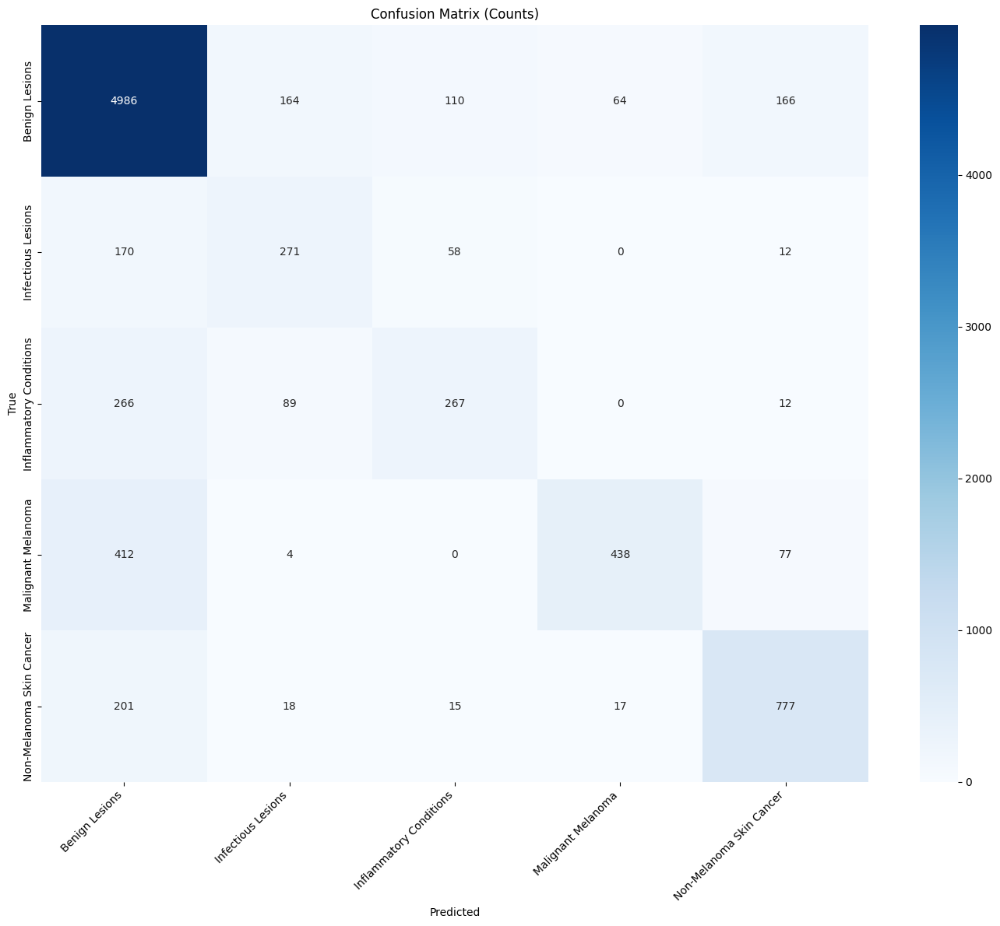


Classification Report:
                          precision    recall  f1-score   support

          Benign Lesions       0.83      0.91      0.87      5490
      Infectious Lesions       0.50      0.53      0.51       511
 Inflammatory Conditions       0.59      0.42      0.49       634
      Malignant Melanoma       0.84      0.47      0.60       931
Non-Melanoma Skin Cancer       0.74      0.76      0.75      1028

                accuracy                           0.78      8594
               macro avg       0.70      0.62      0.64      8594
            weighted avg       0.78      0.78      0.77      8594


==== Analyzing Inflammatory Condition Performance ====
Found inflammatory classes: ['Inflammatory Conditions']


Analyzing inflammatory conditions: 100%|██████████| 269/269 [00:44<00:00,  6.01it/s]



Inflammatory Conditions:
  Accuracy: 0.4211 (267/634)
  Most common misclassifications:
    - Benign Lesions: 266 times
    - Infectious Lesions: 89 times
    - Non-Melanoma Skin Cancer: 12 times

Visualizing inflammatory condition samples:


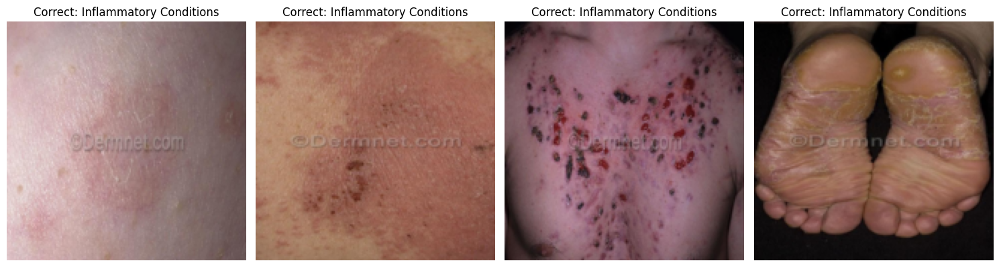

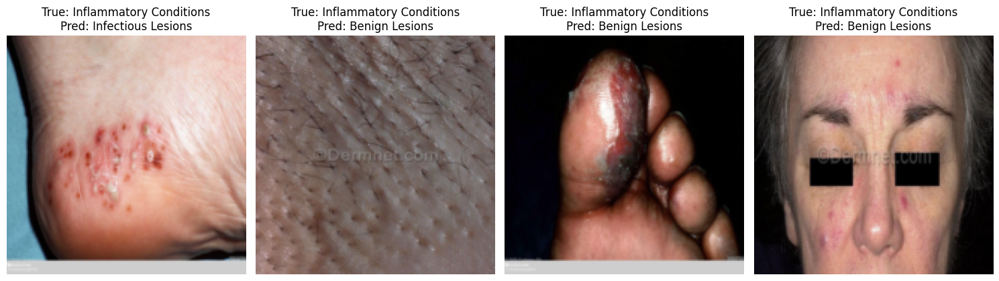

In [ ]:
# ==============================
# 🚂 Step 12: Training Functions
# ==============================
# Import additional modules for inflammatory condition handling
from sklearn.metrics import precision_recall_fscore_support, roc_curve, auc, precision_recall_curve

def train_model_memory_efficient(model, train_loader, val_loader, criterion, optimizer, scheduler, num_epochs=15):
    """Train with mixed precision and gradient accumulation"""
    since = time.time()

    # Setup for mixed precision and gradient accumulation
    scaler = GradScaler()
    accumulation_steps = 4  # Keep this as is

    best_model_wts = copy.deepcopy(model.state_dict())
    best_acc = 0.0
    history = {'train_loss': [], 'train_acc': [], 'val_loss': [], 'val_acc': []}

    # Add early stopping
    best_val_loss = float('inf')

    for epoch in range(num_epochs):
        print(f'Epoch {epoch+1}/{num_epochs}')
        print('-' * 20)

        # Each epoch has a training and validation phase
        for phase in ['train', 'val']:
            if phase == 'train':
                model.train()
            else:
                model.eval()

            running_loss = 0.0
            running_corrects = 0

            # Iterate over data
            for batch_idx, (inputs, labels) in enumerate(tqdm(eval(f"{phase}_loader"), desc=f"{phase}")):
                inputs = inputs.to(device)
                labels = labels.to(device)

                # Zero gradients only at start of accumulation steps
                if phase == 'train' and batch_idx % accumulation_steps == 0:
                    optimizer.zero_grad()

                # Forward pass
                with torch.set_grad_enabled(phase == 'train'):
                    with autocast():  # Mixed precision
                        outputs = model(inputs)
                        loss = criterion(outputs, labels)

                        if phase == 'train':
                            # Scale loss by accumulation steps
                            loss = loss / accumulation_steps

                    _, preds = torch.max(outputs, 1)

                    # Backward + optimize only in training phase
                    if phase == 'train':
                        scaler.scale(loss).backward()

                        # Step optimizer after accumulation steps
                        if (batch_idx + 1) % accumulation_steps == 0 or (batch_idx + 1) == len(eval(f"{phase}_loader")):
                            # Gradient clipping
                            scaler.unscale_(optimizer)
                            torch.nn.utils.clip_grad_norm_(model.parameters(), max_norm=1.0)

                            scaler.step(optimizer)
                            scaler.update()

                # Statistics
                if phase == 'train':
                    running_loss += loss.item() * inputs.size(0) * accumulation_steps
                else:
                    running_loss += loss.item() * inputs.size(0)

                running_corrects += torch.sum(preds == labels.data)

                # Clear cache to free up memory
                del inputs, outputs, preds
                torch.cuda.empty_cache()

            # Calculate epoch metrics
            epoch_loss = running_loss / len(eval(f"{phase}_loader").dataset)
            epoch_acc = running_corrects.double() / len(eval(f"{phase}_loader").dataset)

            print(f'{phase} Loss: {epoch_loss:.4f} Acc: {epoch_acc:.4f}')

            # Save history
            history[f'{phase}_loss'].append(epoch_loss)
            history[f'{phase}_acc'].append(epoch_acc.item())

            # Update learning rate based on validation loss
            if phase == 'val':
                scheduler.step(epoch_loss)

                # Early stopping check
                if epoch_loss < best_val_loss:
                    best_val_loss = epoch_loss
                    counter = 0


                # Save best model
                if epoch_acc > best_acc:
                    best_acc = epoch_acc
                    best_model_wts = copy.deepcopy(model.state_dict())
                    # Save checkpoint
                    torch.save({
                        'epoch': epoch,
                        'model_state_dict': model.state_dict(),
                        'optimizer_state_dict': optimizer.state_dict(),
                        'accuracy': epoch_acc,
                    }, f'/content/resnet50_checkpoint_epoch{epoch+1}.pth')


        # Plot progress after each epoch
        if epoch > 0:
            plot_training_progress(history)

        # Clear cache at end of epoch
        torch.cuda.empty_cache()


        print()

    # Training complete
    time_elapsed = time.time() - since
    print(f'Training complete in {time_elapsed // 60:.0f}m {time_elapsed % 60:.0f}s')
    print(f'Best val Acc: {best_acc:.4f}')

    # Load best model weights
    model.load_state_dict(best_model_wts)
    return model, history

def plot_training_progress(history):
    """Plot training progress during training"""
    plt.figure(figsize=(12, 5))

    # Plot accuracy
    plt.subplot(1, 2, 1)
    plt.plot(history['train_acc'], label='Train')
    plt.plot(history['val_acc'], label='Validation')
    plt.title('Model Accuracy')
    plt.xlabel('Epoch')
    plt.ylabel('Accuracy')
    plt.legend()

    # Plot loss
    plt.subplot(1, 2, 2)
    plt.plot(history['train_loss'], label='Train')
    plt.plot(history['val_loss'], label='Validation')
    plt.title('Model Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.legend()

    plt.tight_layout()
    plt.show()

def create_inflammatory_weighted_loss(class_names, class_counts):
    """Create a more effective weighted loss function"""
    print("\nCreating weighted loss with focus on medically important classes")

    # Get total sample count
    total_samples = sum(class_counts.values())

    # Initialize weights
    weights = []
    for class_name in class_names:
        count = class_counts.get(class_name, 1)
        weight = 1.0

        # Higher weight for inflammatory conditions
        if 'inflammatory' in class_name.lower():
            weight = weight * 1.5
            print(f"  {class_name}: {weight:.2f} (inflammatory emphasis)")
        # Higher weight for dangerous conditions
        elif 'dangerous' in class_name.lower() or 'melanoma' in class_name.lower():
            weight = weight * 1.0
            print(f"  {class_name}: {weight:.2f} (dangerous emphasis)")
        # Higher weight for rare classes
        elif count < total_samples * 0.05:  # Less than 5% of data
            weight = weight * 1.5
            print(f"  {class_name}: {weight:.2f} (rare class emphasis)")
        else:
            print(f"  {class_name}: {weight:.2f}")

        weights.append(weight)

    # Convert to tensor
    class_weights = torch.tensor(weights, dtype=torch.float32)

    # Create weighted loss function
    def weighted_loss(outputs, targets):
        return nn.functional.cross_entropy(outputs, targets, weight=class_weights.to(outputs.device))

    return weighted_loss

# Use pandas value_counts directly
class_counts = train_df['training_class'].value_counts().to_dict()
# Replace your existing criterion line with:
criterion = create_inflammatory_weighted_loss(class_names, class_counts)

# Optimizer depending on model type
if MODEL_TYPE == "inception_v3":
    # Lower learning rate for Inception
    optimizer = optim.SGD(model.parameters(), lr=0.0005, momentum=0.9, weight_decay=1e-4)
else:
    optimizer = optim.SGD(model.parameters(), lr=0.001, momentum=0.9, weight_decay=1e-4)




'''# Replace your optimizer with a more effective one for medical imagery
optimizer = optim.SGD([
    # Different learning rates for different parts of the model
    {'params': model.layer1.parameters(), 'lr': 0.0005},
    {'params': model.layer2.parameters(), 'lr': 0.001},
    {'params': model.layer3.parameters(), 'lr': 0.002},
    {'params': model.layer4.parameters(), 'lr': 0.003},
    {'params': model.fc.parameters(), 'lr': 0.001}
], momentum=0.9, weight_decay=1e-4)'''

# Original optimizer with a single learning rate
optimizer = optim.SGD(model.parameters(), lr=0.001, momentum=0.9, weight_decay=1e-4)

# Improve learning rate scheduler
# Original scheduler
# Use a learning rate scheduler that reduces LR on plateau
scheduler = optim.lr_scheduler.ReduceLROnPlateau(
    optimizer,
    mode='min',
    factor=0.2,  # More aggressive reduction
    patience=5,   # Wait a bit longer before reducing
    min_lr=1e-6,  # Don't let LR get too small
    verbose=True  # Print when LR changes
)
# Setup mixed precision training
scaler = GradScaler()
# ==============================
# 🏃‍♂️ Step 13: Train Model
# ==============================

# Train the model
model, history = train_model_memory_efficient(
    model,
    train_loader,
    val_loader,
    criterion,
    optimizer,
    scheduler,
    num_epochs=40  # Adjust as needed
)

# Plot final training history
plot_training_progress(history)

# ==============================
# 📊 Step 14: Evaluate Model
# ==============================

def evaluate_model(model, test_loader, class_names, device=None):
    """Evaluate model on test data with detailed metrics"""
    if device is None:
        device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

    model.eval()

    # Initialize variables for evaluation
    all_preds = []
    all_labels = []
    all_probs = []
    running_corrects = 0

    # Iterate over test data
    with torch.no_grad():
        for inputs, labels in tqdm(test_loader, desc="Evaluating"):
            inputs = inputs.to(device)
            labels = labels.to(device)

            # Forward pass
            outputs = model(inputs)

            # Get probabilities
            probs = torch.nn.functional.softmax(outputs, dim=1)

            # Get predictions
            _, preds = torch.max(outputs, 1)

            # Update statistics
            running_corrects += torch.sum(preds == labels.data)

            # Store predictions, labels, and probabilities
            all_preds.extend(preds.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())
            all_probs.extend(probs.cpu().numpy())

    # Calculate accuracy
    test_acc = running_corrects.double() / len(test_loader.dataset)
    print(f'Test Accuracy: {test_acc:.4f}')

    # Compute and plot confusion matrix
    cm = confusion_matrix(all_labels, all_preds)

    plt.figure(figsize=(14, 12))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
               xticklabels=class_names, yticklabels=class_names)
    plt.xlabel('Predicted')
    plt.ylabel('True')
    plt.title('Confusion Matrix (Counts)')
    plt.xticks(rotation=45, ha='right')
    plt.tight_layout()
    plt.show()

    # Print classification report
    print("\nClassification Report:")
    print(classification_report(all_labels, all_preds, target_names=class_names))

    return test_acc

def analyze_inflammatory_performance(model, test_loader, class_names, device=None):
    """Specifically analyze performance on inflammatory conditions"""
    print("\n==== Analyzing Inflammatory Condition Performance ====")

    if device is None:
        device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

    model.eval()

    # Find inflammatory condition classes
    inflammatory_indices = [
        i for i, name in enumerate(class_names)
        if 'inflammatory' in name.lower() or 'acne' in name.lower() or 'eczema' in name.lower()
    ]

    if not inflammatory_indices:
        print("No inflammatory condition classes found in the class names.")
        return

    print(f"Found inflammatory classes: {[class_names[i] for i in inflammatory_indices]}")

    # Track predictions for these classes
    all_preds = []
    all_labels = []
    inflammatory_samples = []

    # Evaluate test set
    with torch.no_grad():
        for inputs, labels in tqdm(test_loader, desc="Analyzing inflammatory conditions"):
            inputs = inputs.to(device)
            labels = labels.to(device)

            # Forward pass
            outputs = model(inputs)
            _, preds = torch.max(outputs, 1)

            # Store predictions and true labels
            all_preds.extend(preds.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())

            # Store inflammatory condition samples
            for i, label in enumerate(labels):
                if label.item() in inflammatory_indices:
                    img = inputs[i].cpu().numpy().transpose((1, 2, 0))
                    mean = np.array([0.485, 0.456, 0.406])
                    std = np.array([0.229, 0.224, 0.225])
                    img = std * img + mean
                    img = np.clip(img, 0, 1)

                    inflammatory_samples.append({
                        'image': img,
                        'true_label': class_names[label.item()],
                        'pred_label': class_names[preds[i].item()],
                        'correct': label.item() == preds[i].item()
                    })

    # Calculate performance metrics for inflammatory conditions
    inflammatory_metrics = {}

    for idx in inflammatory_indices:
        class_name = class_names[idx]

        # Find all samples of this class
        true_indices = [i for i, label in enumerate(all_labels) if label == idx]

        if not true_indices:
            continue

        # Calculate accuracy
        correct = sum(1 for i in true_indices if all_preds[i] == idx)
        accuracy = correct / len(true_indices)

        # Store metrics
        inflammatory_metrics[class_name] = {
            'accuracy': accuracy,
            'samples': len(true_indices),
            'correct': correct
        }

        print(f"\n{class_name}:")
        print(f"  Accuracy: {accuracy:.4f} ({correct}/{len(true_indices)})")

        # Common misclassifications
        if len(true_indices) - correct > 0:
            misclassified = [all_preds[i] for i in true_indices if all_preds[i] != idx]
            misclass_counts = Counter([class_names[i] for i in misclassified])

            print("  Most common misclassifications:")
            for wrong_class, count in misclass_counts.most_common(3):
                print(f"    - {wrong_class}: {count} times")

    # Visualize some inflammatory condition samples
    if inflammatory_samples:
        print("\nVisualizing inflammatory condition samples:")

        # Display correctly and incorrectly classified samples
        correct_samples = [s for s in inflammatory_samples if s['correct']][:4]
        incorrect_samples = [s for s in inflammatory_samples if not s['correct']][:4]

        # Plot correct samples
        if correct_samples:
            plt.figure(figsize=(15, 5))
            for i, sample in enumerate(correct_samples):
                plt.subplot(1, len(correct_samples), i+1)
                plt.imshow(sample['image'])
                plt.title(f"Correct: {sample['true_label']}")
                plt.axis('off')
            plt.tight_layout()
            plt.show()

        # Plot incorrect samples
        if incorrect_samples:
            plt.figure(figsize=(15, 5))
            for i, sample in enumerate(incorrect_samples):
                plt.subplot(1, len(incorrect_samples), i+1)
                plt.imshow(sample['image'])
                plt.title(f"True: {sample['true_label']}\nPred: {sample['pred_label']}")
                plt.axis('off')
            plt.tight_layout()
            plt.show()

    return inflammatory_metrics
# Evaluate the model
test_acc = evaluate_model(model, test_loader, class_names, device=device)
inflammatory_metrics = analyze_inflammatory_performance(model, test_loader, class_names, device)

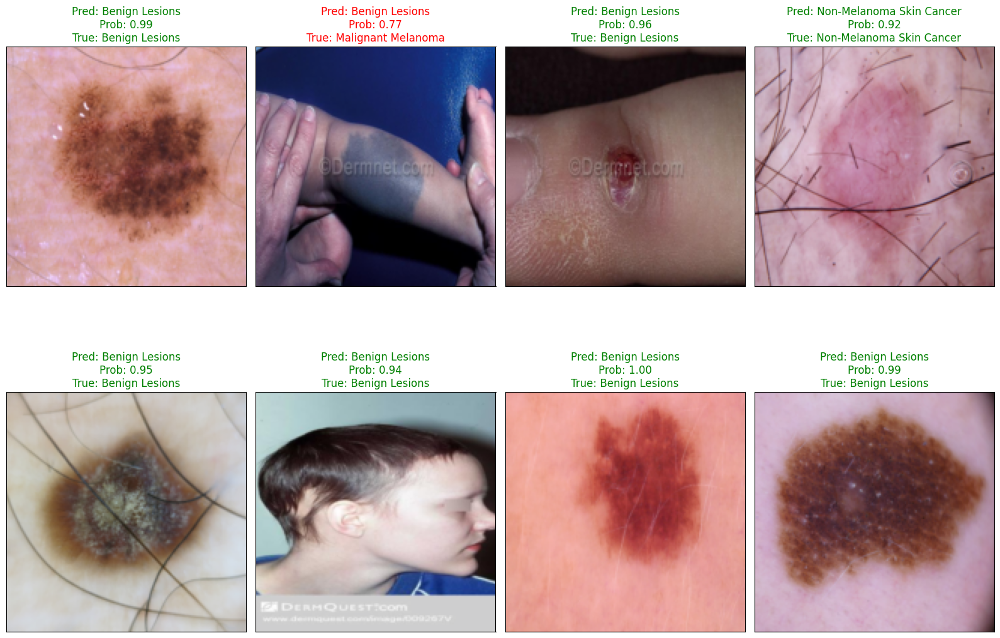

Model saved to '/content/enhanced_skin_lesion_classifier2.pth'


In [ ]:
# ==============================
# 🎨 Step 15: Visualize Predictions
# ==============================

def visualize_model_predictions(model, test_loader, class_names, num_images=8, device=None):
    """Visualize model predictions on sample test images"""
    if device is None:
        device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

    model.eval()

    # Get a batch of test images
    dataiter = iter(test_loader)
    images, labels = next(dataiter)

    # Make predictions
    images = images.to(device)
    with torch.no_grad():
        outputs = model(images)
        probs = torch.nn.functional.softmax(outputs, dim=1)
        _, preds = torch.max(outputs, 1)

    # Plot the images with predictions
    fig = plt.figure(figsize=(16, 12))
    for idx in range(min(num_images, len(images))):
        ax = fig.add_subplot(2, 4, idx + 1, xticks=[], yticks=[])

        # Un-normalize the image
        img = images[idx].cpu().numpy().transpose((1, 2, 0))
        mean = np.array([0.485, 0.456, 0.406])
        std = np.array([0.229, 0.224, 0.225])
        img = std * img + mean
        img = np.clip(img, 0, 1)

        ax.imshow(img)

        # Get the true and predicted labels
        true_label = class_names[labels[idx]]
        pred_label = class_names[preds[idx].item()]
        prob = probs[idx][preds[idx]].item()

        # Set title color based on correctness
        title_color = 'green' if pred_label == true_label else 'red'

        # Create the title: predicted (probability) [true]
        ax.set_title(f"Pred: {pred_label}\nProb: {prob:.2f}\nTrue: {true_label}",
                    color=title_color)

    plt.tight_layout()
    plt.show()

# Visualize predictions
visualize_model_predictions(model, test_loader, class_names, device=device)

# ==============================
# 💾 Step 16: Save Model
# ==============================

# Save model checkpoint
checkpoint_path = '/content/enhanced_skin_lesion_classifier2.pth'
torch.save({
    'model_state_dict': model.state_dict(),
    'class_names': class_names,
    'model_type': MODEL_TYPE,
    'test_accuracy': test_acc,
}, checkpoint_path)
print(f"Model saved to '{checkpoint_path}'")

In [ ]:
# Auto-download to your computer
from google.colab import files
files.download(checkpoint_path)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Testing image: /content/testimage3.jpeg


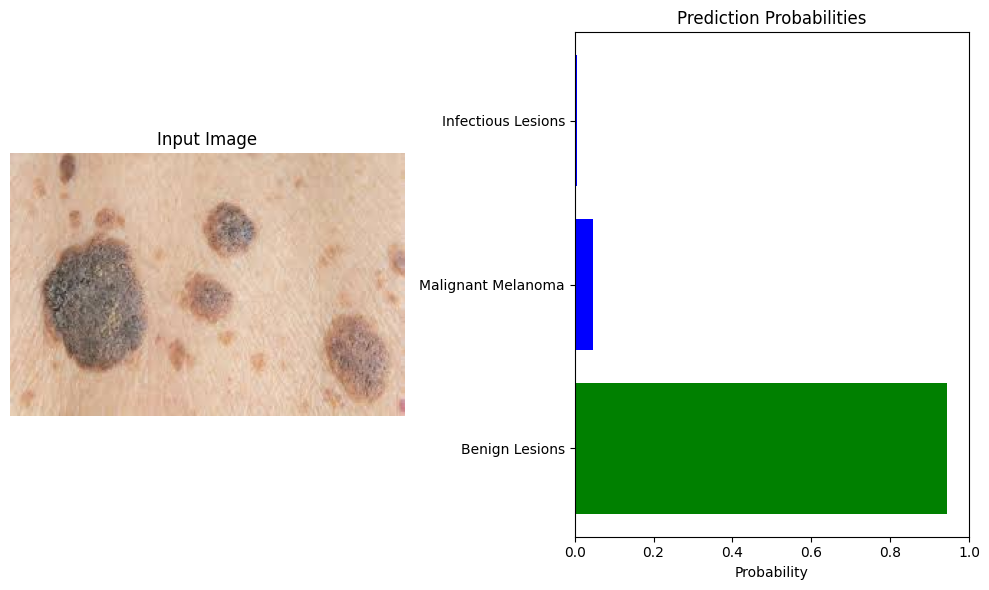

Top prediction: Benign Lesions with 0.94 probability

Top 3 predictions:
1. Benign Lesions: 0.9441
2. Malignant Melanoma: 0.0465
3. Infectious Lesions: 0.0065


In [ ]:
def predict_skin_lesion(model, image_path, class_names, device=None, image_size=224):
    """Make a prediction on a single skin lesion image"""
    if device is None:
        device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

    # Prepare image transformation
    transform = transforms.Compose([
        transforms.Resize((image_size, image_size)),
        transforms.ToTensor(),
        transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
    ])

    # Load and transform image
    try:
        img = Image.open(image_path).convert('RGB')
        img_t = transform(img).unsqueeze(0).to(device)
    except Exception as e:
        print(f"Error loading image: {str(e)}")
        return None

    # Set model to evaluation mode
    model.eval()

    # Make prediction
    with torch.no_grad():
        outputs = model(img_t)
        probs = torch.nn.functional.softmax(outputs, dim=1)[0]
        _, pred_idx = torch.max(outputs, 1)

    # Get prediction and probability
    prediction = class_names[pred_idx.item()]
    probability = probs[pred_idx].item()

    # Get top 3 predictions
    top_probs, top_idxs = torch.topk(probs, 3)
    top_predictions = [(class_names[idx.item()], prob.item()) for idx, prob in zip(top_idxs, top_probs)]

    # Visualize result
    plt.figure(figsize=(10, 6))

    # Display image
    plt.subplot(1, 2, 1)
    plt.imshow(img)
    plt.title("Input Image")
    plt.axis('off')

    # Display predictions
    plt.subplot(1, 2, 2)
    colors = ['green', 'blue', 'blue']
    top_classes = [p[0] for p in top_predictions]
    top_values = [p[1] for p in top_predictions]

    bars = plt.barh(top_classes, top_values, color=colors)
    plt.xlim(0, 1)
    plt.title("Prediction Probabilities")
    plt.xlabel("Probability")
    plt.tight_layout()
    plt.show()

    print(f"Top prediction: {prediction} with {probability:.2f} probability")
    print("\nTop 3 predictions:")
    for i, (class_name, prob) in enumerate(top_predictions, 1):
        print(f"{i}. {class_name}: {prob:.4f}")

    # Return results
    return {
        "prediction": prediction,
        "probability": probability,
        "top_predictions": top_predictions
    }

# Example of using the prediction function (uncomment to use)
# Select a test image to predict
# Uncomment and modify the path to test your image
image_path = "/content/testimage3.jpeg"  # Replace with actual path to your testimage
print(f"Testing image: {image_path}")
prediction_result = predict_skin_lesion(model, image_path, class_names, device, image_size=160)
